# Importing Library

In [1]:
import pandas as pd
import numpy as np
import yfinance as yf
from datetime import datetime
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
from keras.models import Model
from keras.layers import Input, LSTM, Dense, Reshape, Dropout, GRU, Conv2D, Conv1D, TimeDistributed
from tensorflow.keras.layers import BatchNormalization
from tqdm import tqdm
from tensorflow.keras.layers import Input, Dense, Concatenate, Reshape, LSTM, MultiHeadAttention
from tensorflow.keras.layers import Input, Dense, Concatenate, Reshape, LSTM, MultiHeadAttention, Attention, AdditiveAttention
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback


In [2]:
scaler = MinMaxScaler()


def dataset_gen(data_full_df):

    columns_to_normalize = ['Open','High', 'Low', 'Close', 'Volume']
    data_full_df[columns_to_normalize] = scaler.fit_transform(data_full_df[columns_to_normalize])
    data_full_df = data_full_df.drop(columns=['Adj Close'], axis=1)
    print(data_full_df.head(5))
    data_full_np = data_full_df.values

    x_train = []
    y_train = []
    x_test = []
    y_test = []

    last_index = 0
    for i in tqdm(range(0, data_full_np.shape[0] - 300)):
        x_train.append(data_full_np[i:i + 200])
        y_train.append(data_full_np[i + 200:i + 220])
        last_index= i
    x_train = np.array(x_train)
    y_train = np.array(y_train)

    x_test.append( data_full_np[last_index+10: last_index+210])
    y_test.append(data_full_np[last_index+210: last_index+230])
    x_test.append(data_full_np[last_index+40: last_index+240])
    y_test.append(data_full_np[last_index+240: last_index+260])
    x_test.append(data_full_np[last_index+60: last_index+260])
    y_test.append(data_full_np[last_index+260: last_index+280])

    x_test = np.array(x_test)
    y_test = np.array(y_test)

    print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)
    return x_train, y_train, x_test, y_test

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Importing datset and prepocessing

## Amazon dataset

In [4]:
AMZN_df = pd.read_csv('/content/drive/MyDrive/DLS_Final_pro/AMZN.csv')

print(AMZN_df.info())
print(AMZN_df.describe())

AMZN_x_train, AMZN_y_train, AMZN_x_test, AMZN_y_test = dataset_gen(AMZN_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean     37.637044    38.085257    37.150524    37.627145    37.627145   
std      51.325787    51.931140    50.660187    51.295879    51.295879   
min       0.295500     0.305000     0.275500     0.298500     0.298500   
25%       2.265625     2.300000     2.226125     2.263875     2.263875   
50%      10.167750   

100%|██████████| 5722/5722 [00:00<00:00, 279190.89it/s]


(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


## S and P 500 Dataset

In [5]:
SPX_df = df = pd.read_csv('/content/drive/MyDrive/DLS_Final_pro/SPX.csv')

print(SPX_df.info())
print(SPX_df.describe())

SPX_x_train, SPX_y_train, SPX_x_test, SPX_y_test = dataset_gen(SPX_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean   1966.479966  1978.106107  1953.972933  1966.739870  1966.739870   
std    1053.525035  1058.846003  1047.942096  1053.737482  1053.737482   
min     679.280029   695.270020   666.789978   676.530029   676.530029   
25%    1191.147522  1198.464966  1183.897553  1191.300018  1191.300018   
50%    1456.320007  1

100%|██████████| 5722/5722 [00:00<00:00, 214215.14it/s]


(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


## Duke Energy Dataset

In [6]:
DUK_df = df = pd.read_csv('/content/drive/MyDrive/DLS_Final_pro/DUK.csv')

print(DUK_df.info())
print(DUK_df.describe())

DUK_x_train, DUK_y_train, DUK_x_test, DUK_y_test = dataset_gen(DUK_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean     67.037377    67.623590    66.408560    67.033302    44.574863   
std      20.109515    20.235137    19.990161    20.115417    26.139180   
min      21.477455    21.860983    21.285692    21.477455     8.033481   
25%      51.130989    51.608761    50.695164    51.183289    23.198706   
50%      66.946358   

100%|██████████| 5722/5722 [00:00<00:00, 341206.85it/s]


(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


## Apple Dataset

In [7]:
AAPL_df = df = pd.read_csv('/content/drive/MyDrive/DLS_Final_pro/AAPL.csv')

print(AAPL_df.info())
print(AAPL_df.describe())

AAPL_x_train, AAPL_y_train, AAPL_x_test, AAPL_y_test = dataset_gen(AAPL_df)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean     35.440285    35.829528    35.067292    35.464683    34.154099   
std      50.442579    51.011087    49.919386    50.491567    50.278543   
min       0.231964     0.235536     0.227143     0.234286     0.198599   
25%       2.152947     2.188393     2.122500     2.149196     1.821830   
50%      14.394643   

100%|██████████| 5722/5722 [00:00<00:00, 241848.21it/s]


(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


## Defining Callback class

In [8]:
def test_model(model, x_test_s, y_test, y_test_full):

    for i in range(x_test_s.shape[0]):
        # print(x_test_s[i,:,:].shape)
        # print(x_test_m[i,:,:].shape)
        prediction = model.predict(x_test_s[i,:,:].reshape(1,x_test_s.shape[1],5).astype('float32'))
        fig = plt.figure(figsize=(18, 4))

        plt.subplot(1,4,1)
        plt.plot(x_test_s[i,:,0])
        plt.plot(range(len(x_test_s[i, :, 0]), len(x_test_s[i, :, 0]) + len(y_test[i, :, 0])), y_test[i, :, 0], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 0]), len(x_test_s[i, :, 0]) + len(y_test[i, :, 0])), prediction[0, :, 0], label='actual prediction', s=1)
        if float(prediction[0, :, 0][0]) > float(x_test_s[i,:,0][-1]):
            prediction[0, :, 0] = prediction[0, :, 0] - (prediction[0, :, 0][0] - x_test_s[i,:,0][-1])
        elif float(prediction[0, :, 0][0]) < float(x_test_s[i,:,0][-1]):
            prediction[0, :, 0] = prediction[0, :, 0] + (x_test_s[i,:,0][-1] - prediction[0, :, 0][0])
        plt.plot(range(len(x_test_s[i, :, 0]), len(x_test_s[i, :, 0]) + len(y_test[i, :, 0])), prediction[0, :, 0], label='adjusted prediction')
        plt.title('Open price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()

        plt.subplot(1,4,2)
        plt.plot(x_test_s[i,:,1])
        plt.plot(range(len(x_test_s[i, :, 1]), len(x_test_s[i, :, 1]) + len(y_test[i, :, 1])), y_test[i, :, 1], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 1]), len(x_test_s[i, :, 1]) + len(y_test[i, :, 1])), prediction[0, :, 1], label='actual prediction', s=1)
        if float(prediction[0, :, 1][0]) > float(x_test_s[i,:,1][-1]):
            prediction[0, :, 1] = prediction[0, :, 1] - (prediction[0, :, 1][0] - x_test_s[i,:,1][-1])
        elif float(prediction[0, :, 1][0]) < float(x_test_s[i,:,1][-1]):
            prediction[0, :, 1] = prediction[0, :, 1] + (x_test_s[i,:,1][-1] - prediction[0, :, 1][0])
        plt.plot(range(len(x_test_s[i, :, 1]), len(x_test_s[i, :, 1]) + len(y_test[i, :, 1])), prediction[0, :, 1], label='adjusted prediction')
        plt.title('High price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()

        plt.subplot(1,4,3)
        plt.plot(x_test_s[i,:,2])
        plt.plot(range(len(x_test_s[i, :, 2]), len(x_test_s[i, :, 2]) + len(y_test[i, :, 2])), y_test[i, :, 2], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 2]), len(x_test_s[i, :, 2]) + len(y_test[i, :, 2])), prediction[0, :, 2], label='actual prediction', s=1)
        if float(prediction[0, :, 2][0]) > float(x_test_s[i,:,2][-1]):
            prediction[0, :, 2] = prediction[0, :, 2] - (prediction[0, :, 2][0] - x_test_s[i,:,2][-1])
        elif float(prediction[0, :, 2][0]) < float(x_test_s[i,:,2][-1]):
            prediction[0, :, 2] = prediction[0, :, 2] + (x_test_s[i,:,2][-1] - prediction[0, :, 2][0])
        plt.plot(range(len(x_test_s[i, :, 2]), len(x_test_s[i, :, 2]) + len(y_test[i, :, 2])), prediction[0, :, 2], label='adjusted prediction')
        plt.title('Low price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()


        plt.subplot(1,4,4)
        plt.plot(x_test_s[i,:,3])
        plt.plot(range(len(x_test_s[i, :, 3]), len(x_test_s[i, :, 3]) + len(y_test[i, :, 3])), y_test[i, :, 3], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 3]), len(x_test_s[i, :, 3]) + len(y_test[i, :, 3])), prediction[0, :, 3], label='actual prediction', s=1)
        if float(prediction[0, :, 3][0]) > float(x_test_s[i,:,3][-1]):
            prediction[0, :, 3] = prediction[0, :, 3] - (prediction[0, :, 3][0] - x_test_s[i,:,3][-1])
        elif float(prediction[0, :, 3][0]) < float(x_test_s[i,:,3][-1]):
            prediction[0, :, 3] = prediction[0, :, 3] + (x_test_s[i,:,3][-1] - prediction[0, :, 3][0])
        plt.plot(range(len(x_test_s[i, :, 3]), len(x_test_s[i, :, 3]) + len(y_test[i, :, 3])), prediction[0, :, 3], label='adjusted prediction')
        plt.title('Close price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()

    plt.show()

class CustomCallback(Callback):
        def __init__(self, model, stock_test_x_data, market_test_x_data, stock_test_y_data):
            self.model = model
            self.stock_test_x_data = stock_test_x_data
            self.market_test_x_data = market_test_x_data
            self.stock_test_y_data = stock_test_y_data


        def on_epoch_end(self, epoch,logs=None):
            test_model(self.model, self.stock_test_x_data[:,:,1:], self.stock_test_y_data[:,:,1:], self.stock_test_y_data[:,:,:])

# Vanilla LSTM model Architecture

## Vanilla LSTM model- AMZN

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 200, 5)]          0         
                                                                 
 lstm_4 (LSTM)               (None, 200, 128)          68608     
                                                                 
 lstm_5 (LSTM)               (None, 128)               131584    
                                                                 
 dense_2 (Dense)             (None, 80)                10320     
                                                                 
 reshape_2 (Reshape)         (None, 20, 4)             0         
                                                                 
Total params: 210512 (822.31 KB)
Trainable params: 210512 (822.31 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


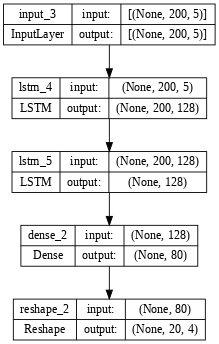

In [13]:
# Define input shape
input_shape = (200, 5)

# Input layer
inputs1 = Input(shape=input_shape)
lstm1 = LSTM(units=128, activation='tanh', return_sequences=True)(inputs1)
lstm1 = LSTM(units=128, activation='tanh')(lstm1)
output = Dense(80)(lstm1)
reshaped_output = Reshape((20, 4))(output)

AMZN_lstm_model_v = Model(inputs=inputs1, outputs=reshaped_output)
AMZN_lstm_model_v.compile(optimizer=Adam(learning_rate=0.0001), loss='mse')
AMZN_lstm_model_v.summary()

tf.keras.utils.plot_model(AMZN_lstm_model_v, show_shapes=True, dpi=64)

Epoch 1/15
1/1 [==============================] - 0s 22ms/step


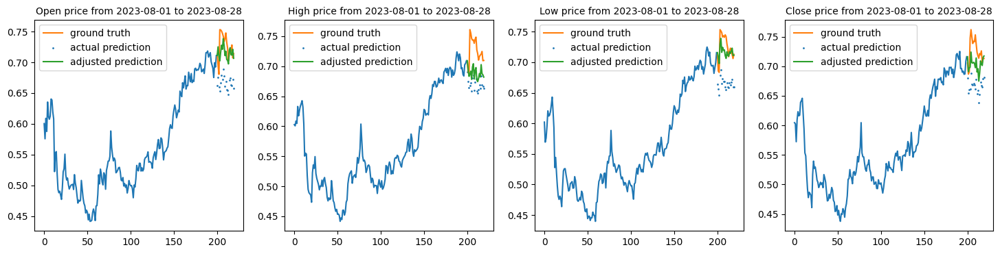

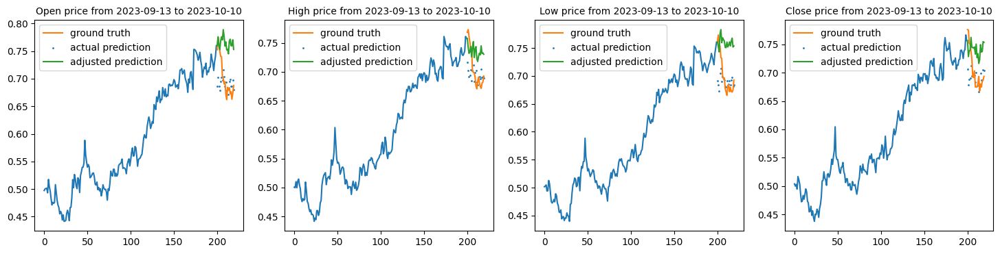

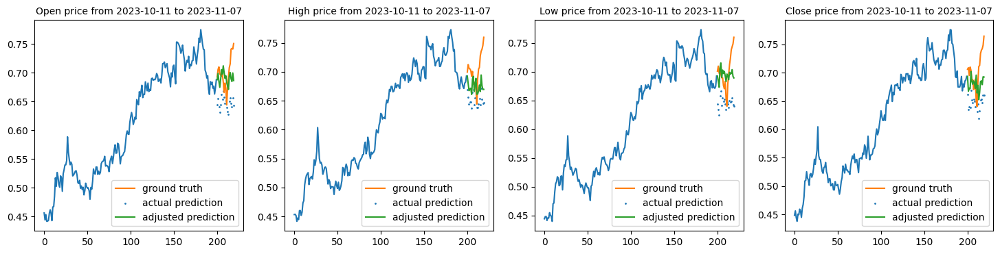

5722/5722 [==============================] - 94s 16ms/step - loss: 0.0022 - val_loss: 0.0030
Epoch 2/15
1/1 [==============================] - 0s 32ms/step


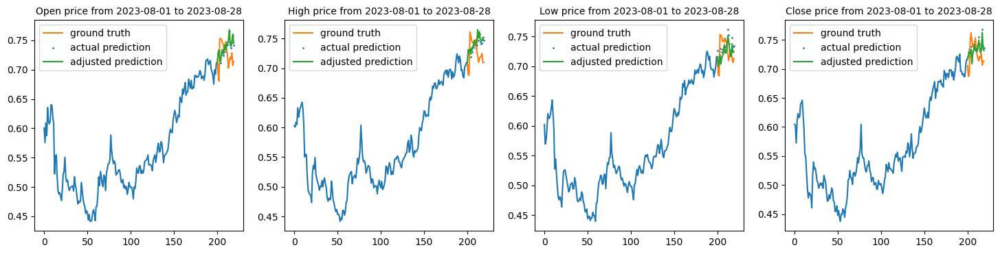

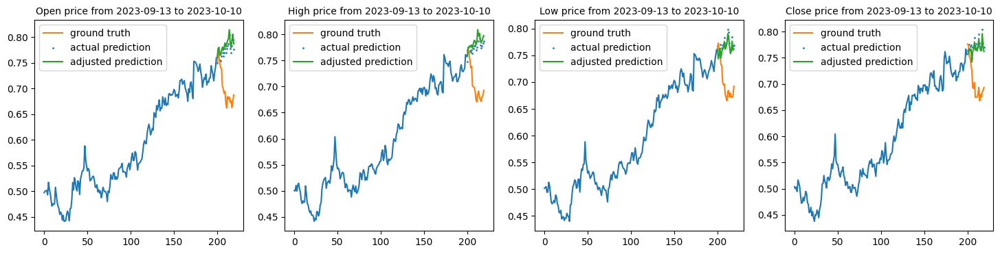

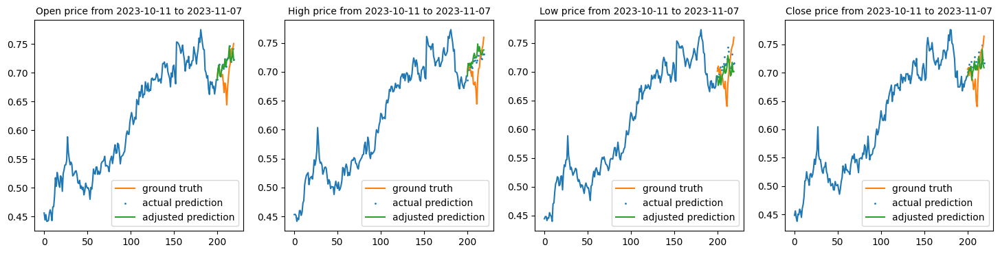

5722/5722 [==============================] - 95s 17ms/step - loss: 8.9893e-04 - val_loss: 0.0028
Epoch 3/15
1/1 [==============================] - 0s 21ms/step


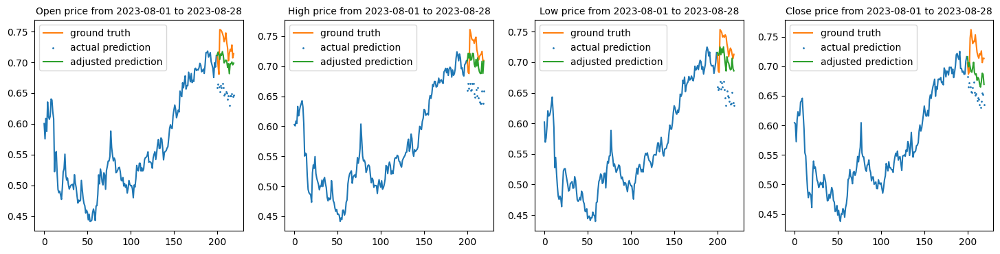

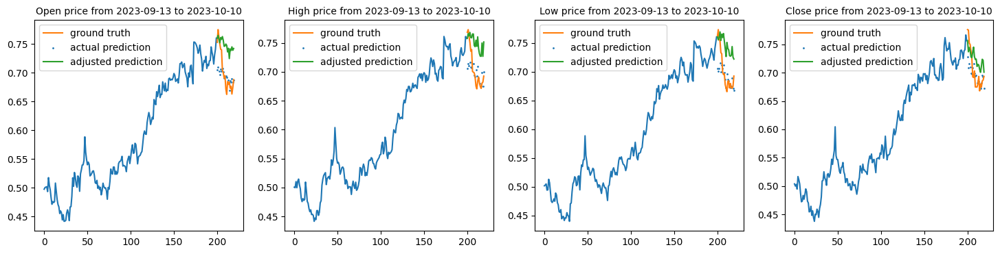

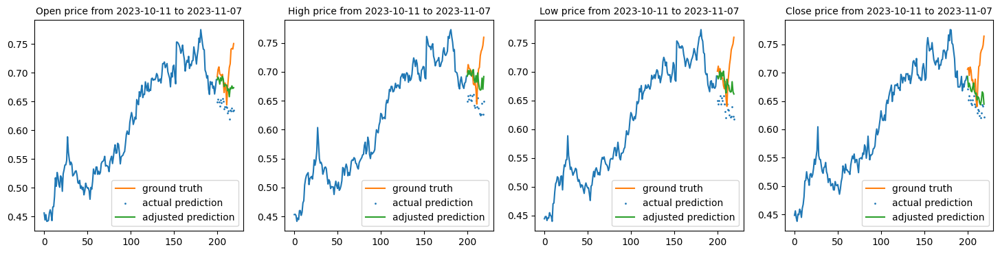

5722/5722 [==============================] - 94s 16ms/step - loss: 7.6467e-04 - val_loss: 0.0038
Epoch 4/15
1/1 [==============================] - 0s 41ms/step


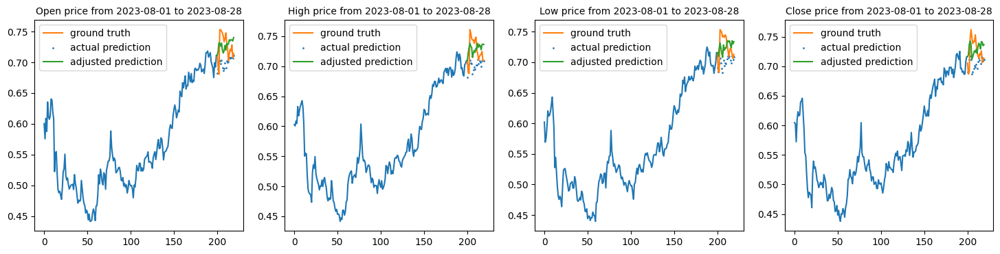

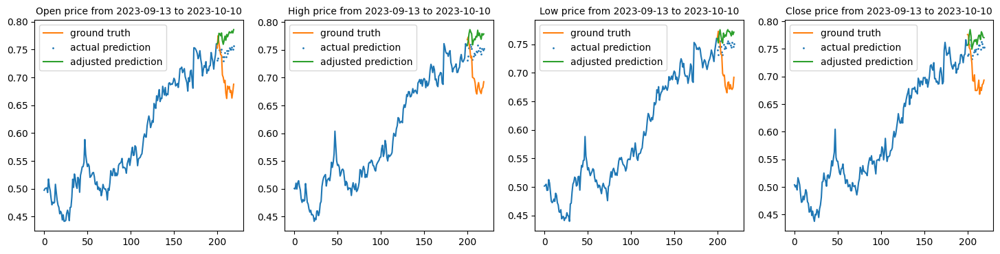

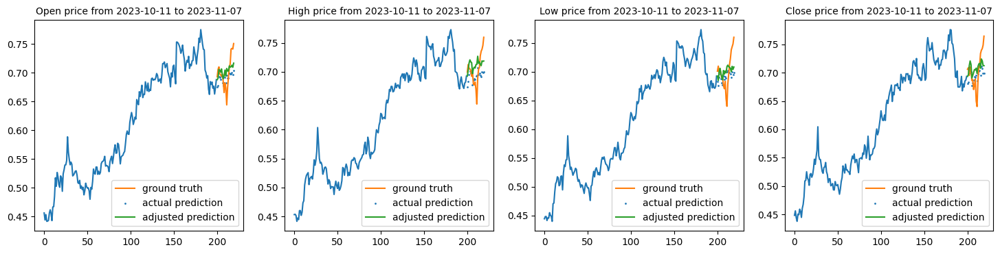

5722/5722 [==============================] - 97s 17ms/step - loss: 7.3194e-04 - val_loss: 0.0017
Epoch 5/15
1/1 [==============================] - 0s 39ms/step


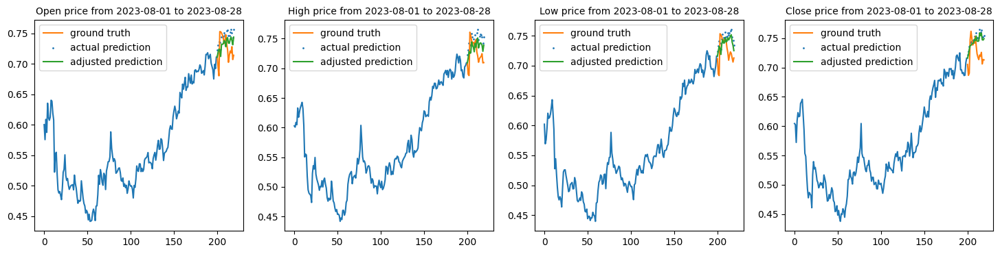

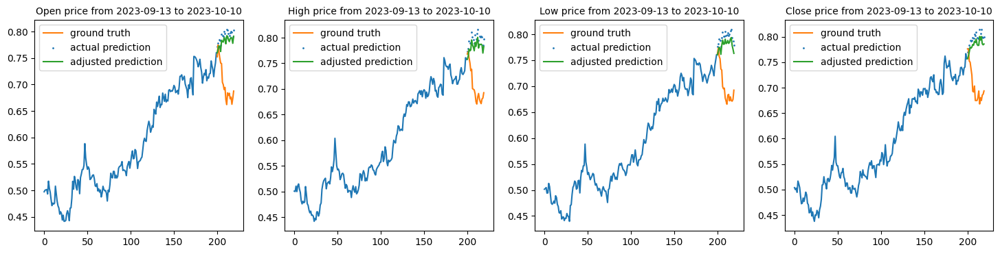

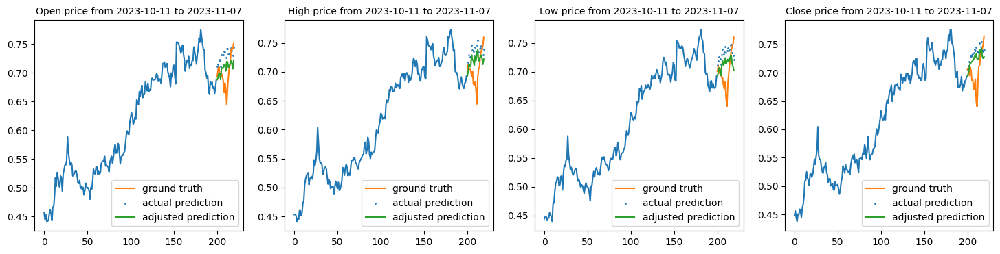

5722/5722 [==============================] - 101s 18ms/step - loss: 6.7419e-04 - val_loss: 0.0043
Epoch 6/15
1/1 [==============================] - 0s 34ms/step


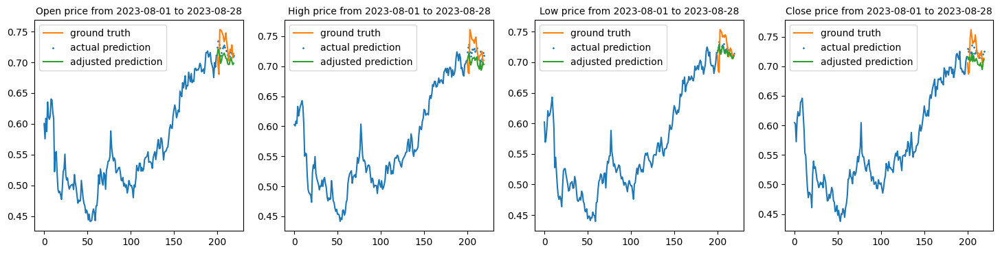

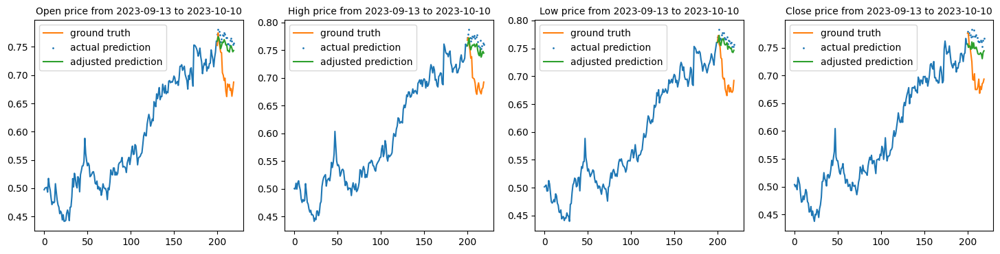

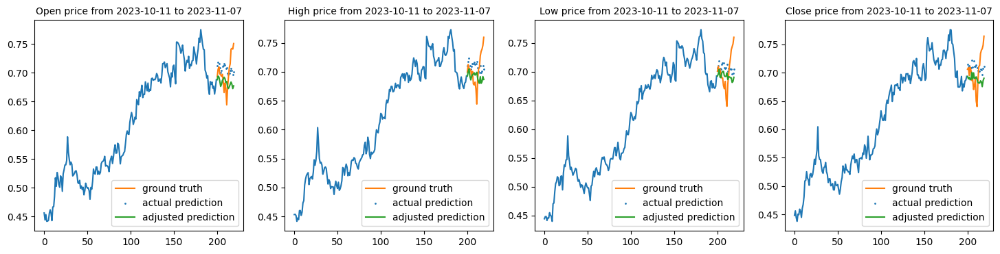

5722/5722 [==============================] - 102s 18ms/step - loss: 6.3862e-04 - val_loss: 0.0022
Epoch 7/15
1/1 [==============================] - 0s 32ms/step


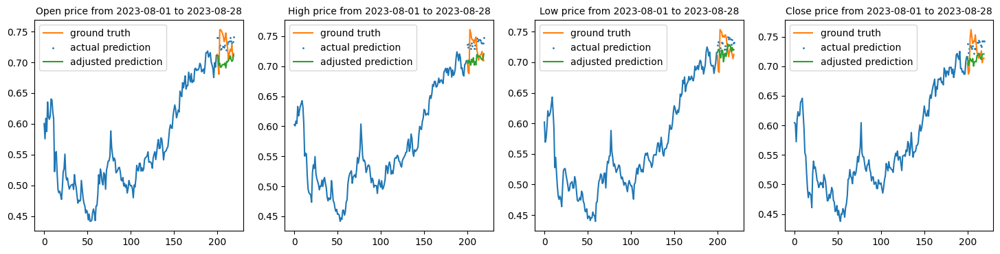

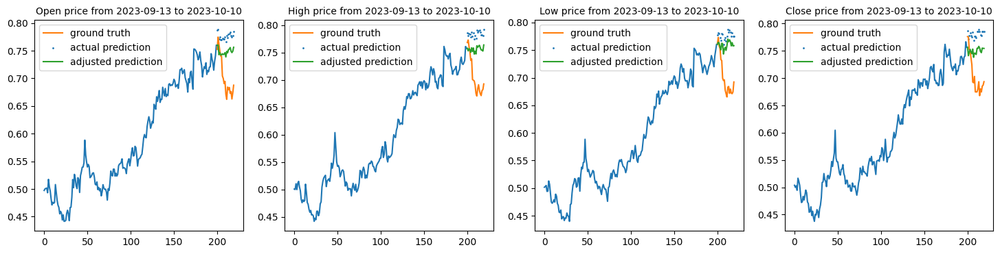

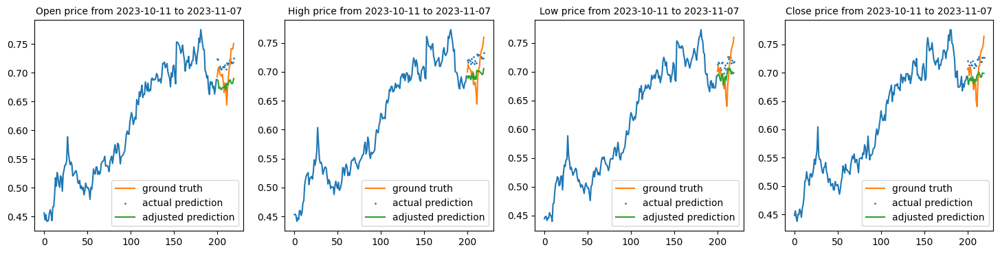

5722/5722 [==============================] - 108s 19ms/step - loss: 6.2395e-04 - val_loss: 0.0028
Epoch 8/15
1/1 [==============================] - 0s 23ms/step


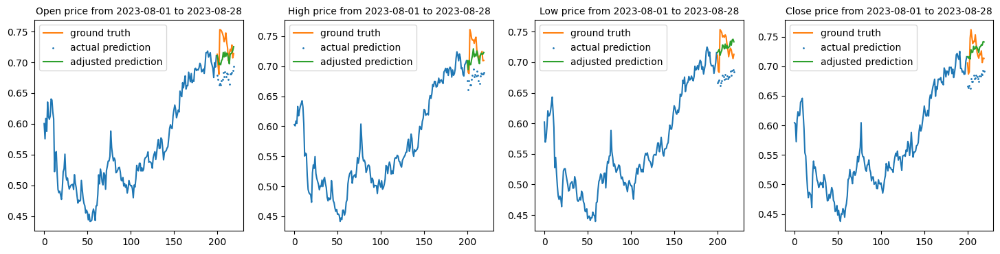

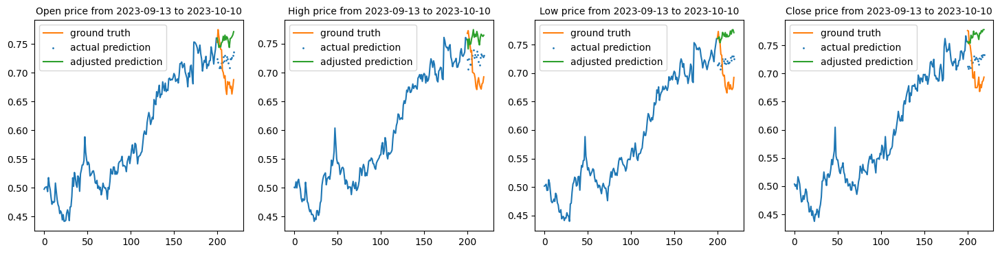

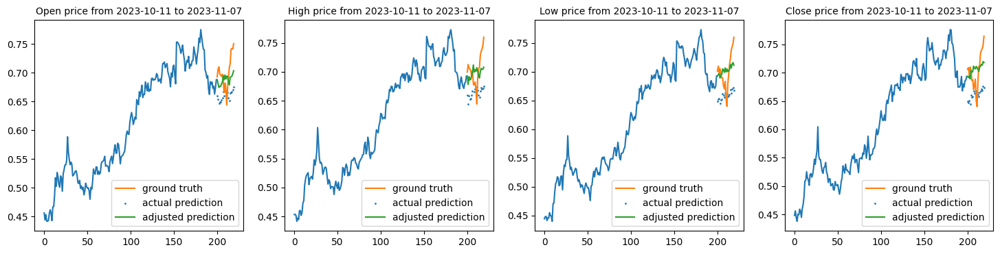

5722/5722 [==============================] - 112s 20ms/step - loss: 6.0172e-04 - val_loss: 0.0024
Epoch 9/15
1/1 [==============================] - 0s 59ms/step


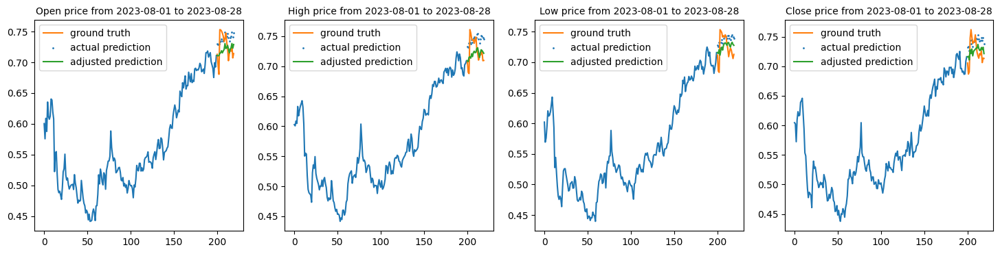

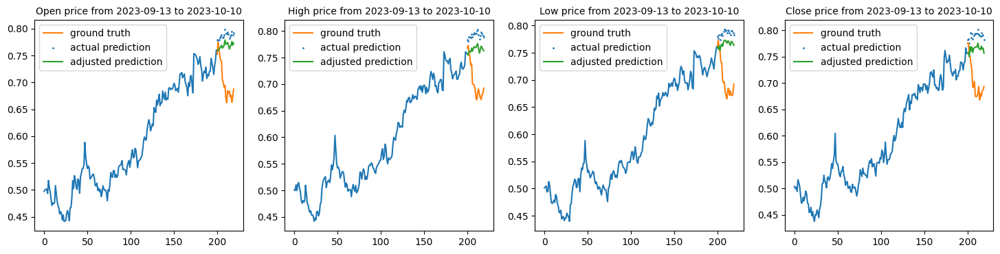

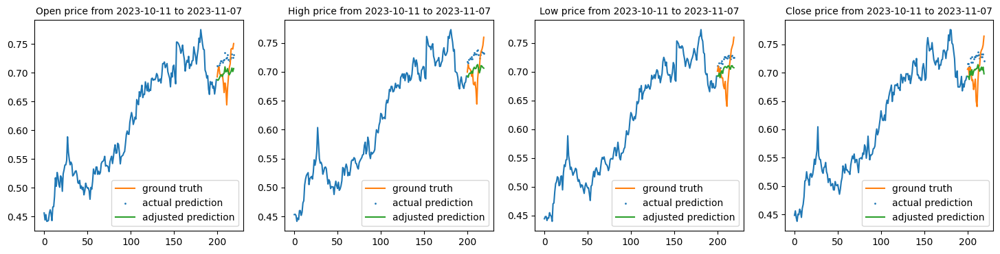

5722/5722 [==============================] - 118s 21ms/step - loss: 5.8949e-04 - val_loss: 0.0036
Epoch 10/15
1/1 [==============================] - 0s 35ms/step


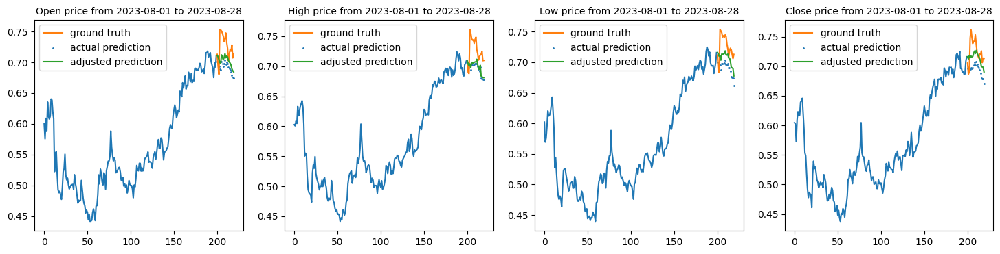

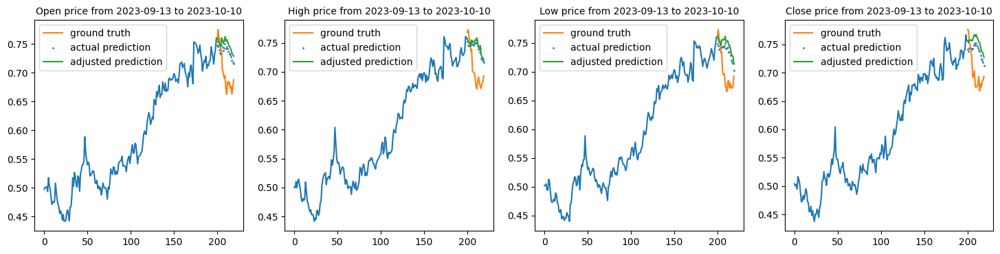

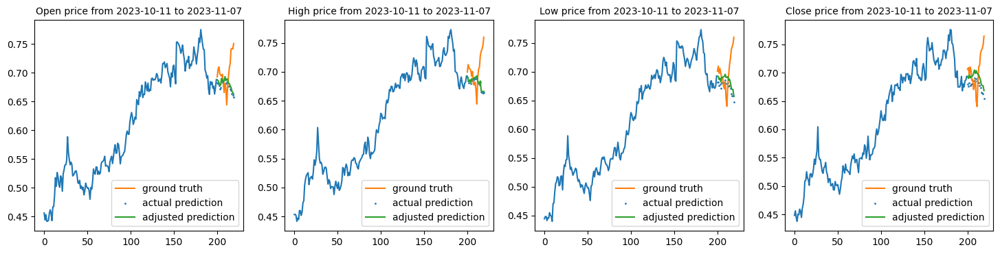

5722/5722 [==============================] - 117s 20ms/step - loss: 5.7066e-04 - val_loss: 0.0019
Epoch 11/15
1/1 [==============================] - 0s 33ms/step


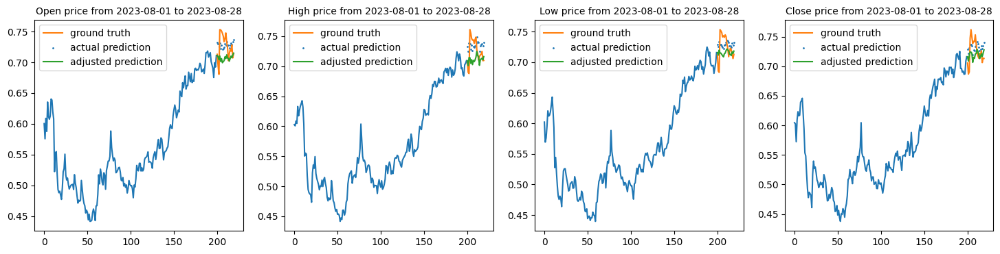

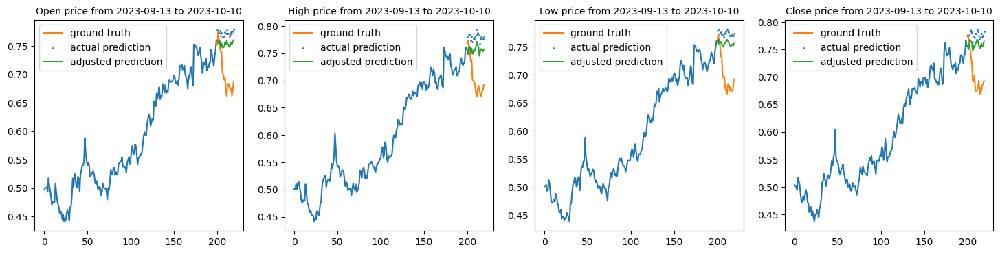

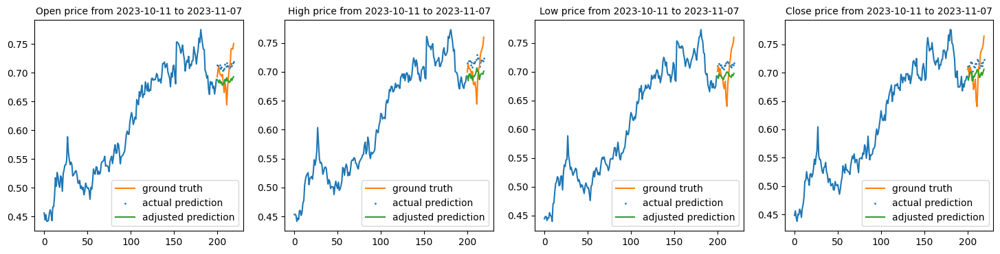

5722/5722 [==============================] - 119s 21ms/step - loss: 5.8075e-04 - val_loss: 0.0026
Epoch 12/15
1/1 [==============================] - 0s 42ms/step


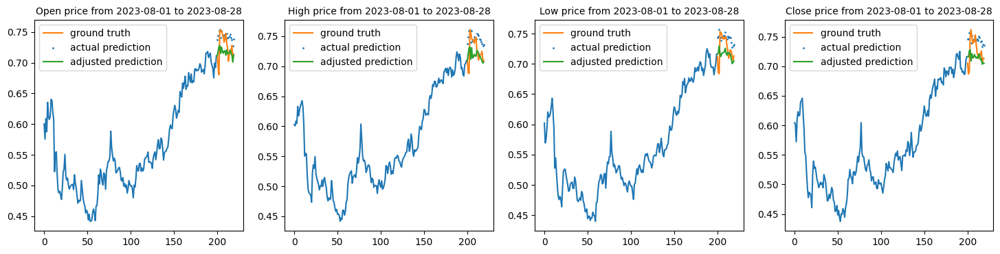

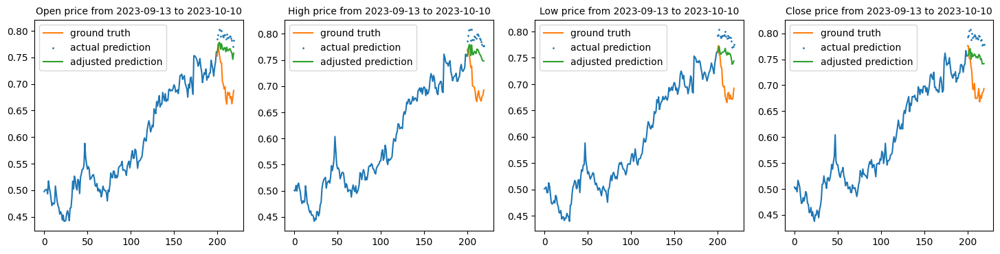

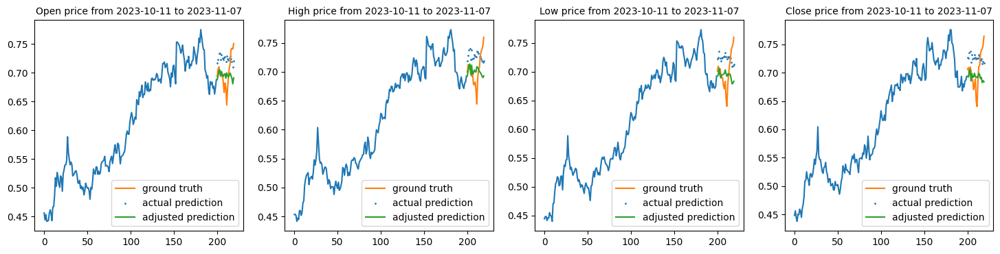

5722/5722 [==============================] - 131s 23ms/step - loss: 5.6513e-04 - val_loss: 0.0036
Epoch 13/15
1/1 [==============================] - 0s 32ms/step


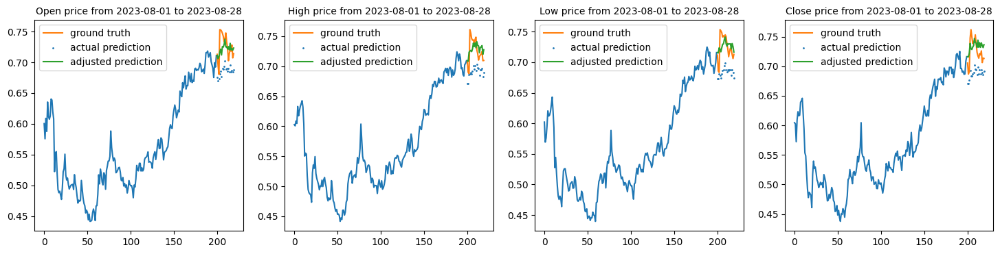

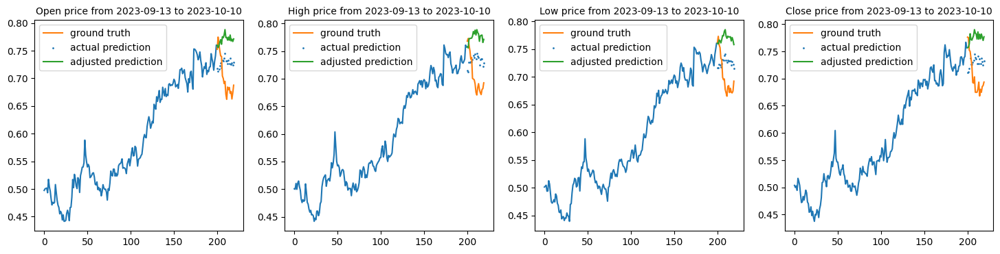

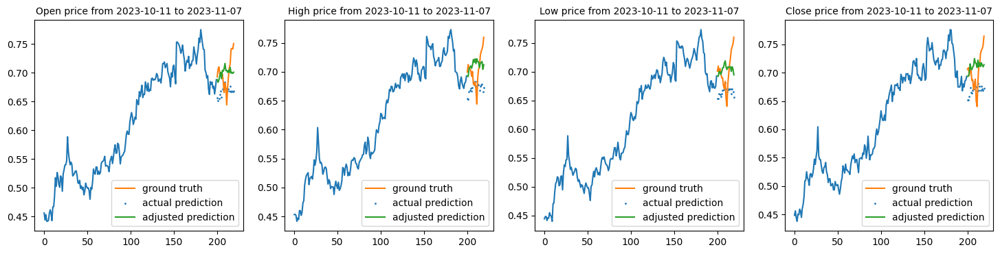

5722/5722 [==============================] - 121s 21ms/step - loss: 5.4743e-04 - val_loss: 0.0021
Epoch 14/15
1/1 [==============================] - 0s 70ms/step


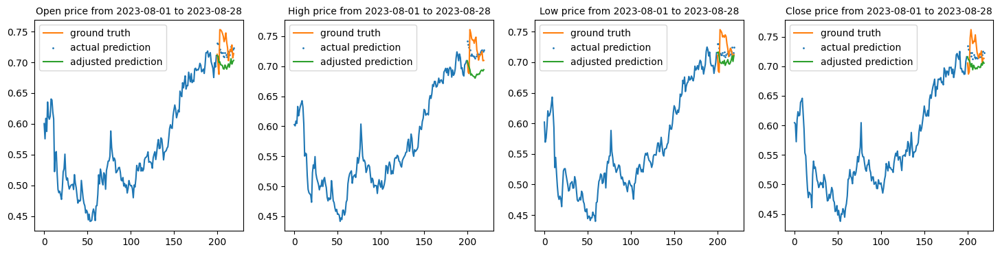

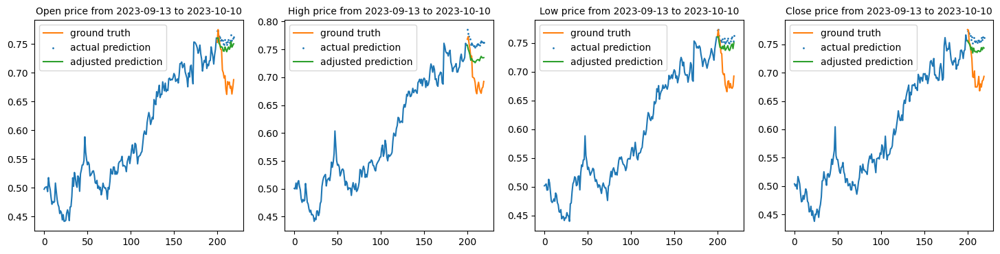

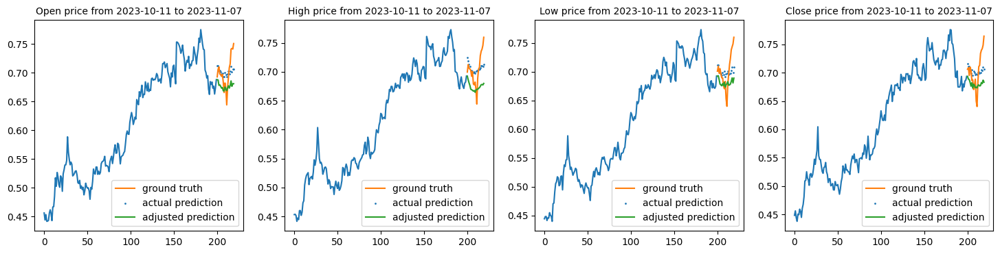

5722/5722 [==============================] - 116s 20ms/step - loss: 5.6088e-04 - val_loss: 0.0018
Epoch 15/15
1/1 [==============================] - 0s 34ms/step


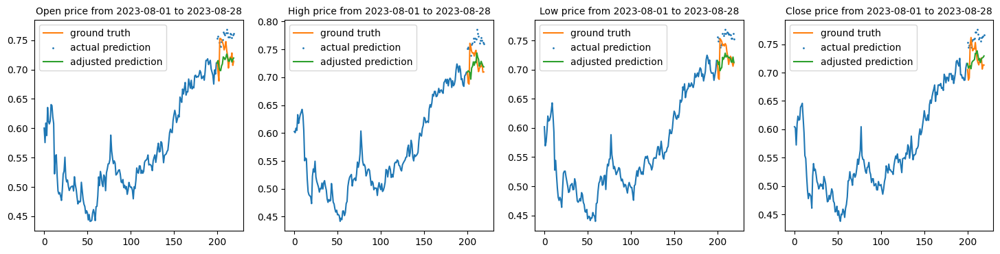

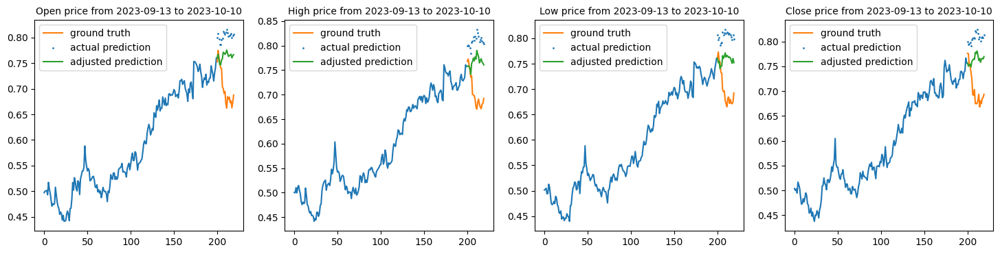

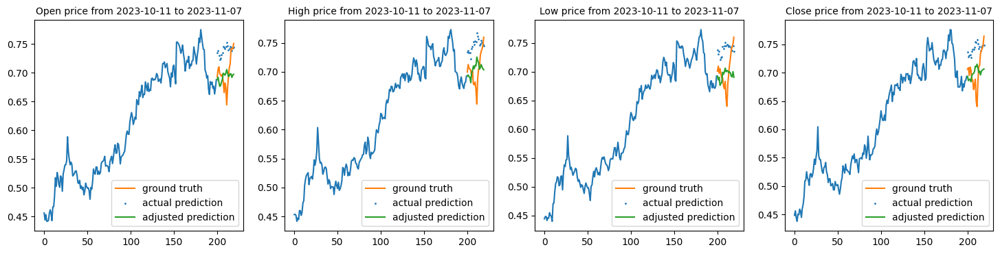

5722/5722 [==============================] - 117s 20ms/step - loss: 5.4554e-04 - val_loss: 0.0054
[0.002984018763527274, 0.0028189129661768675, 0.0038273008540272713, 0.0017206515185534954, 0.004289770498871803, 0.0021676961332559586, 0.002840784378349781, 0.0023606771137565374, 0.0035567807499319315, 0.0018731903983280063, 0.0025987932458519936, 0.0036099618300795555, 0.002051855204626918, 0.0017779454356059432, 0.005414482206106186]
[0.002248271368443966, 0.000898925238288939, 0.000764670199714601, 0.0007319371215999126, 0.0006741906399838626, 0.0006386219756677747, 0.0006239491049200296, 0.0006017163395881653, 0.0005894932546652853, 0.0005706588854081929, 0.0005807502311654389, 0.0005651327082887292, 0.0005474321660585701, 0.0005608819774352014, 0.0005455372738651931]


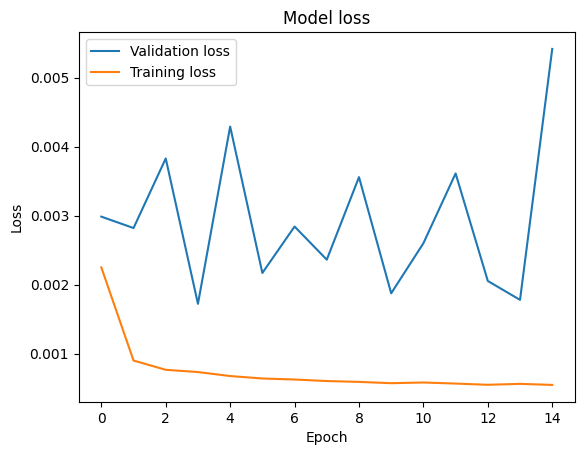

In [14]:
AMZN_lstm_model_v_callback = CustomCallback(AMZN_lstm_model_v, AMZN_x_test[:,:,:], SPX_x_test[:,:,:], AMZN_y_test[:,:,:5])
AMZN_lstm_model_v_history = AMZN_lstm_model_v.fit(AMZN_x_train[:,:,1:].astype('float32'), AMZN_y_train[:,:,1:5].astype('float32'), epochs=15, batch_size=1, callbacks=[AMZN_lstm_model_v_callback], validation_data=(AMZN_x_test[:,:,1:].astype('float32'), AMZN_y_test[:,:,1:5].astype('float32')))
print(AMZN_lstm_model_v_history.history['val_loss'])
print(AMZN_lstm_model_v_history.history['loss'])

plt.plot(AMZN_lstm_model_v_history.history['val_loss'])
plt.plot(AMZN_lstm_model_v_history.history['loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Validation loss', 'Training loss'])
plt.show()

## Vanilla LSTM model- DUK

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 200, 5)]          0         
                                                                 
 lstm_6 (LSTM)               (None, 200, 128)          68608     
                                                                 
 lstm_7 (LSTM)               (None, 128)               131584    
                                                                 
 dense_3 (Dense)             (None, 80)                10320     
                                                                 
 reshape_3 (Reshape)         (None, 20, 4)             0         
                                                                 
Total params: 210512 (822.31 KB)
Trainable params: 210512 (822.31 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


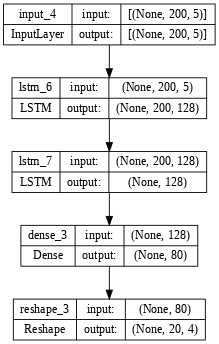

In [15]:
# Define input shape
input_shape = (200, 5)

# Input layer
inputs1 = Input(shape=input_shape)
lstm1 = LSTM(units=128, activation='tanh', return_sequences=True)(inputs1)
lstm1 = LSTM(units=128, activation='tanh')(lstm1)
output = Dense(80)(lstm1)
reshaped_output = Reshape((20, 4))(output)

DUK_lstm_model_v = Model(inputs=inputs1, outputs=reshaped_output)
DUK_lstm_model_v.compile(optimizer=Adam(learning_rate=0.0001), loss='mse')
DUK_lstm_model_v.summary()

tf.keras.utils.plot_model(DUK_lstm_model_v, show_shapes=True, dpi=64)

Epoch 1/15
1/1 [==============================] - 0s 41ms/step


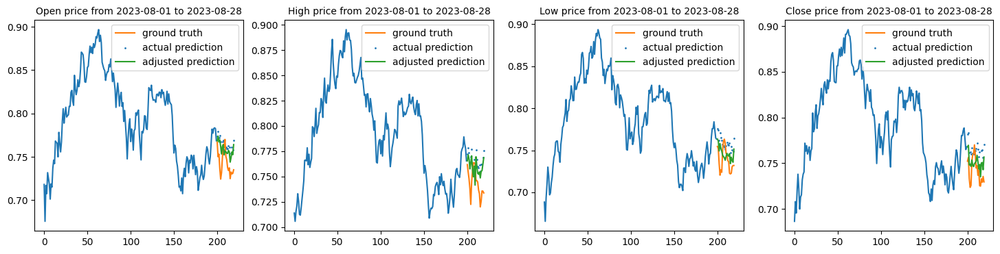

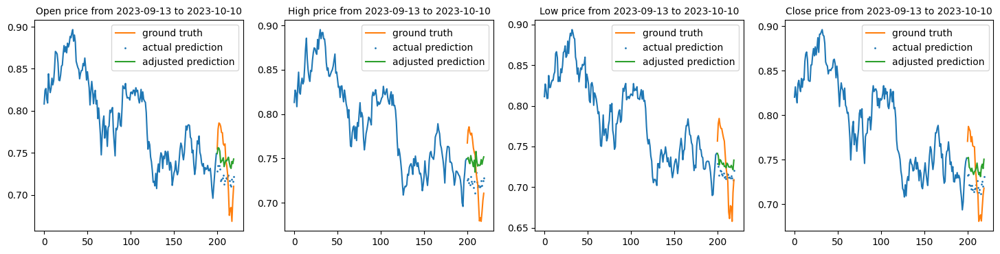

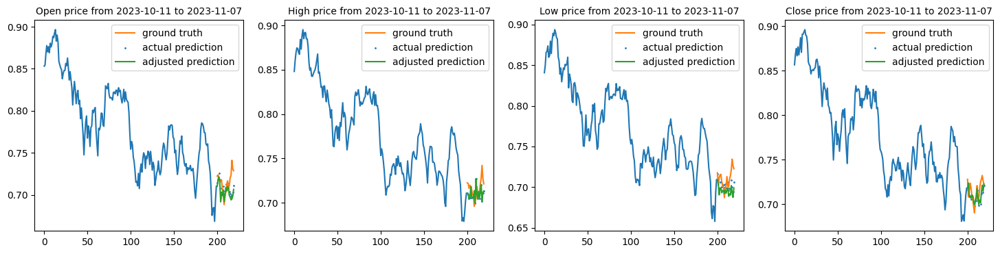

5722/5722 [==============================] - 123s 21ms/step - loss: 0.0043 - val_loss: 8.2032e-04
Epoch 2/15
1/1 [==============================] - 0s 67ms/step


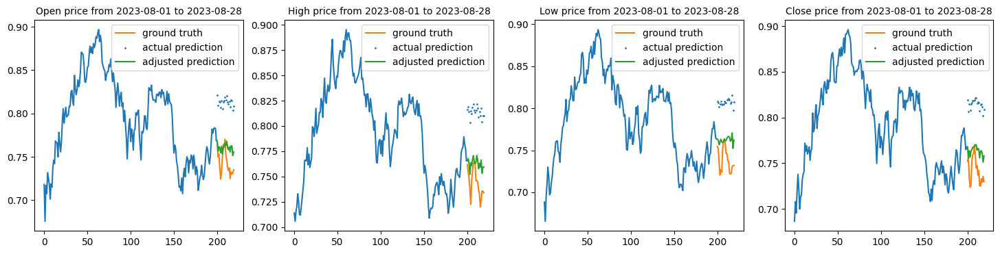

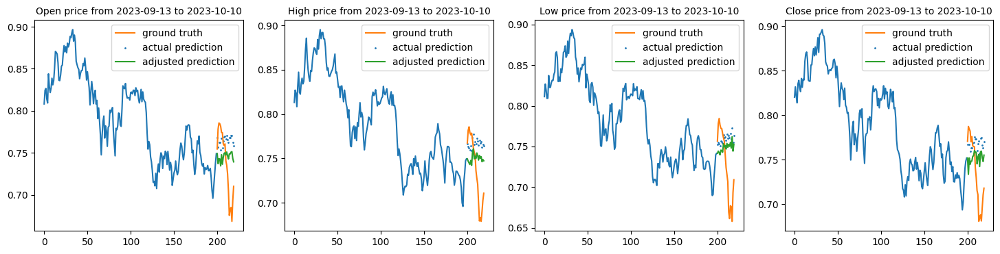

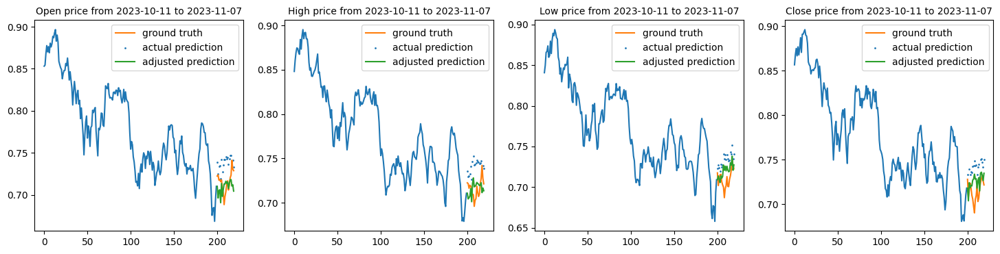

5722/5722 [==============================] - 120s 21ms/step - loss: 0.0015 - val_loss: 0.0028
Epoch 3/15
1/1 [==============================] - 0s 23ms/step


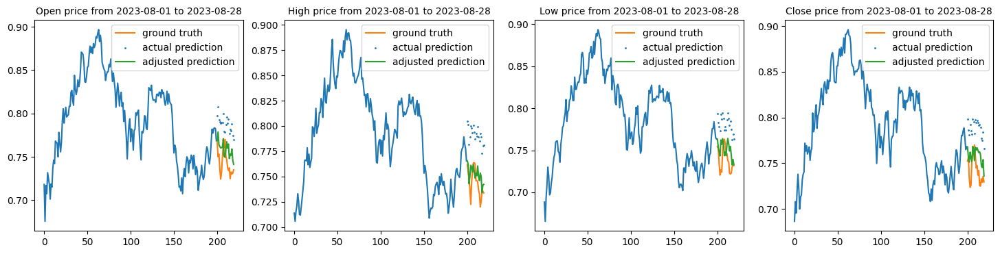

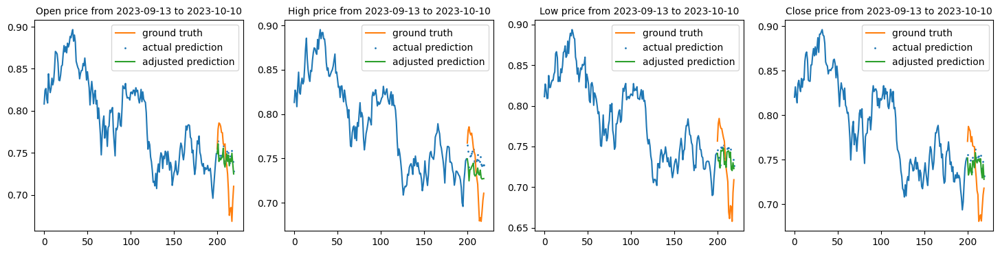

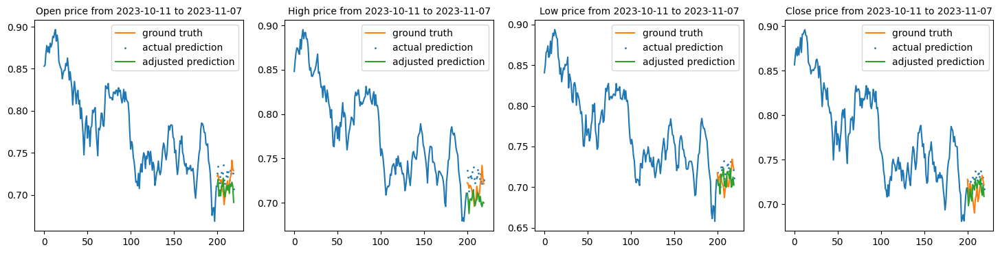

5722/5722 [==============================] - 108s 19ms/step - loss: 0.0013 - val_loss: 0.0014
Epoch 4/15
1/1 [==============================] - 0s 36ms/step


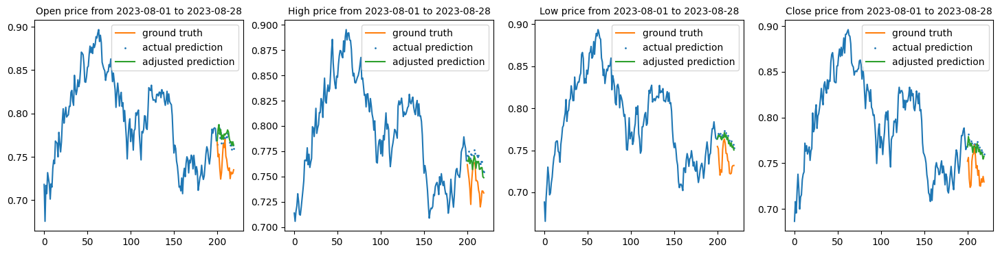

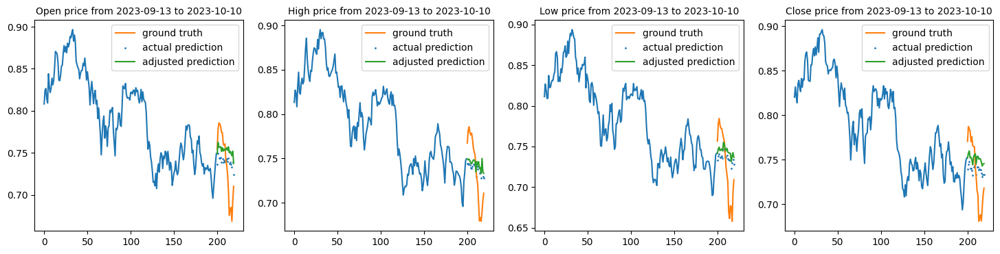

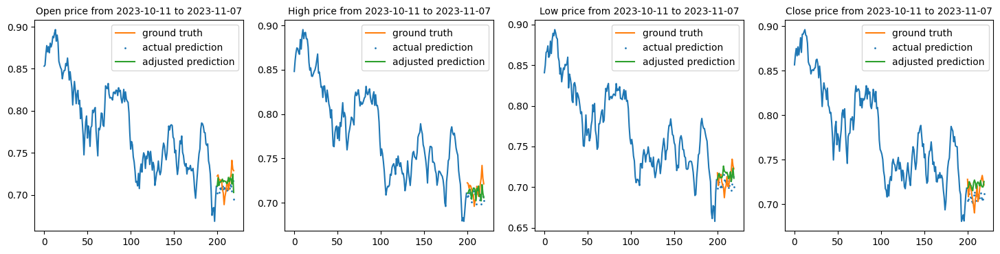

5722/5722 [==============================] - 103s 18ms/step - loss: 0.0012 - val_loss: 7.9760e-04
Epoch 5/15
1/1 [==============================] - 0s 37ms/step


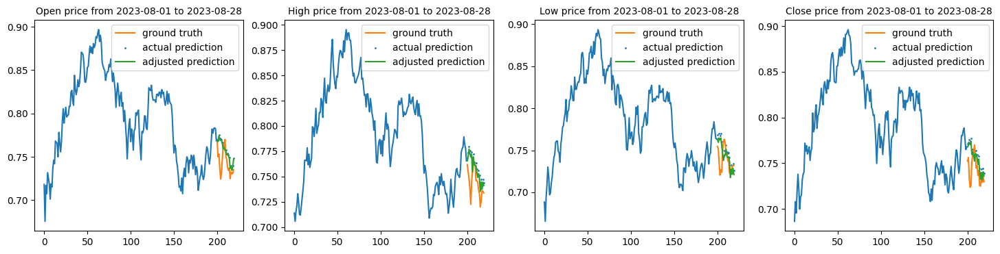

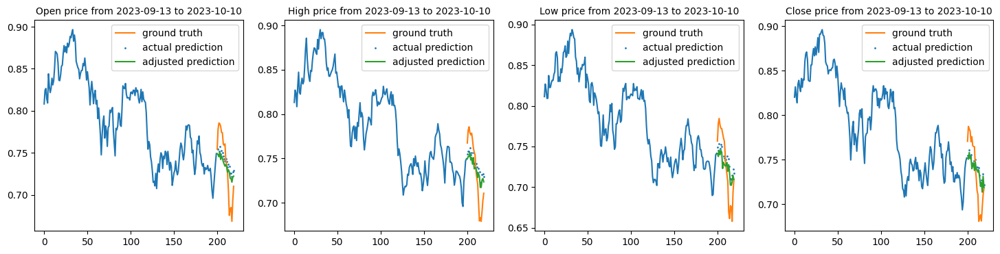

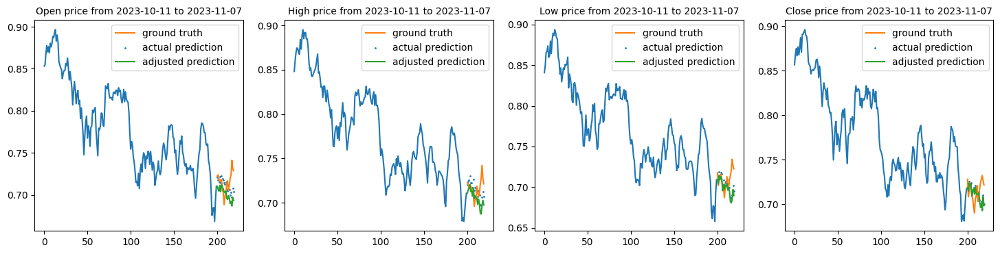

5722/5722 [==============================] - 103s 18ms/step - loss: 0.0011 - val_loss: 5.3168e-04
Epoch 6/15
1/1 [==============================] - 0s 32ms/step


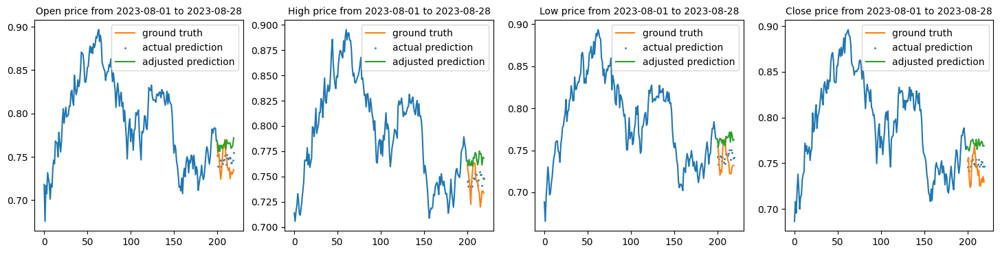

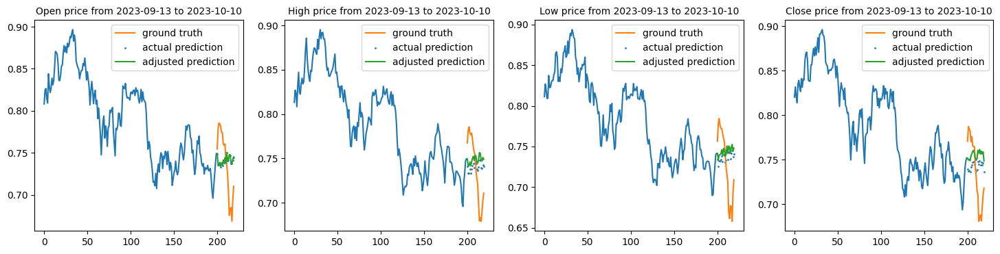

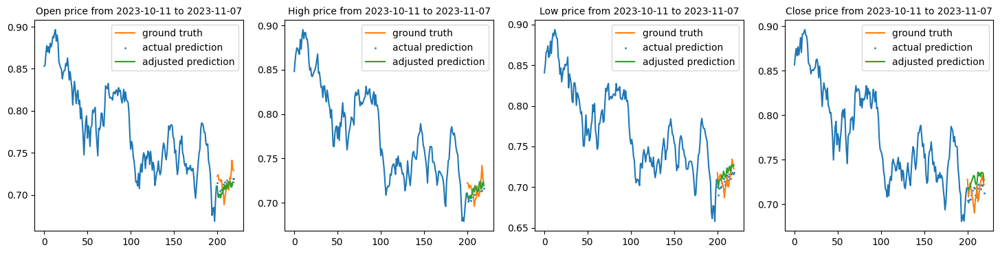

5722/5722 [==============================] - 114s 20ms/step - loss: 0.0011 - val_loss: 7.2611e-04
Epoch 7/15
1/1 [==============================] - 0s 39ms/step


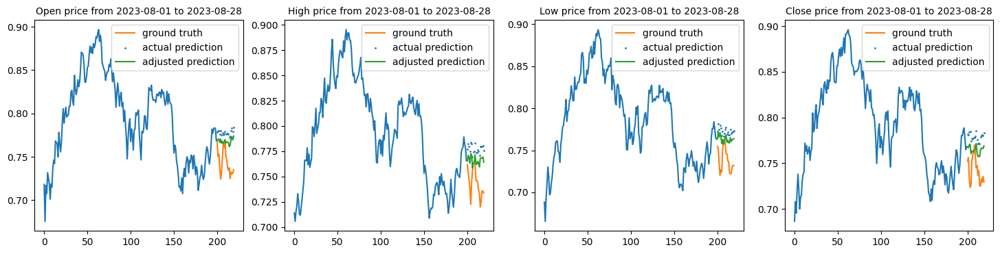

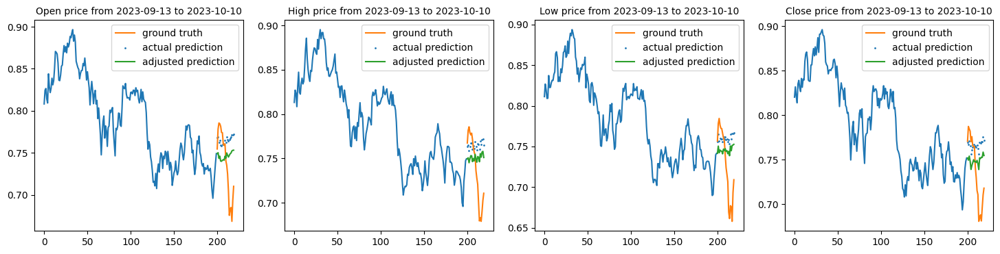

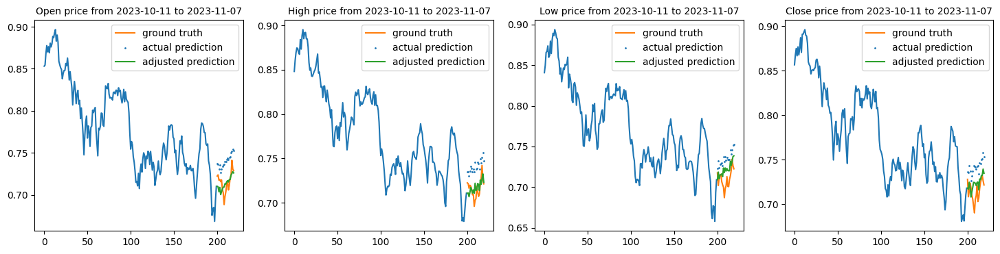

5722/5722 [==============================] - 113s 20ms/step - loss: 0.0011 - val_loss: 0.0016
Epoch 8/15
1/1 [==============================] - 0s 55ms/step


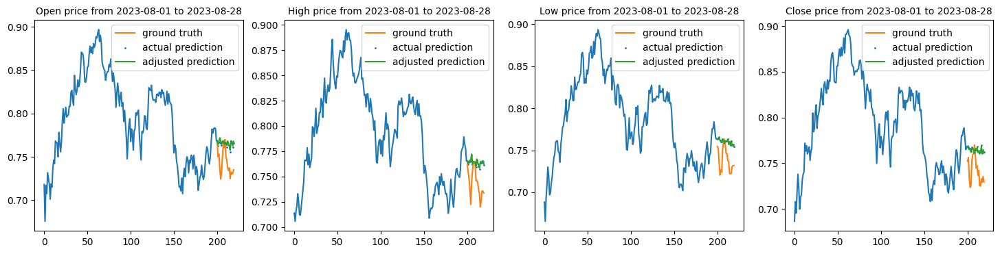

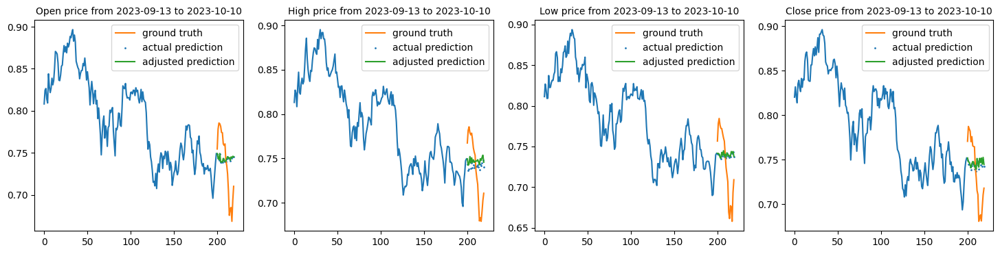

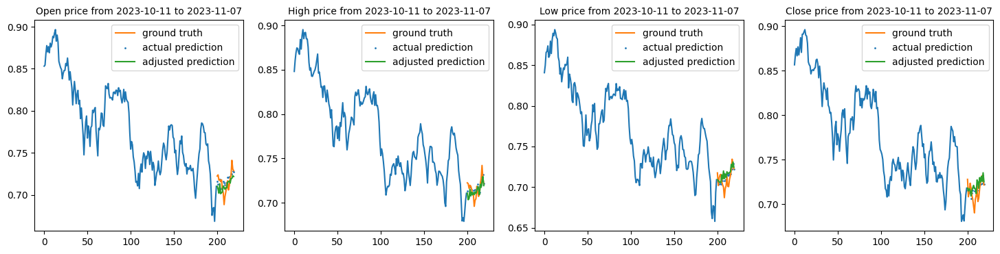

5722/5722 [==============================] - 125s 22ms/step - loss: 0.0010 - val_loss: 8.0134e-04
Epoch 9/15
1/1 [==============================] - 0s 59ms/step


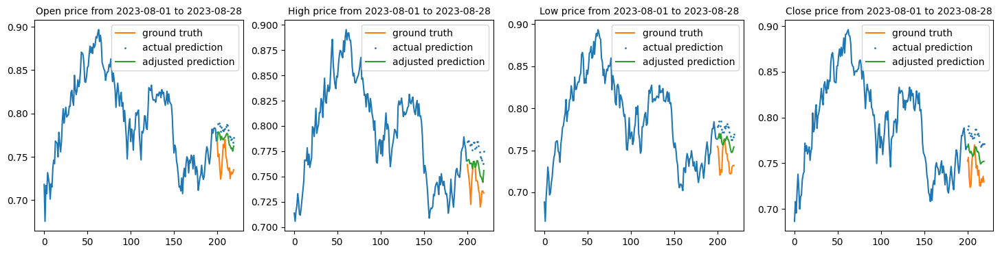

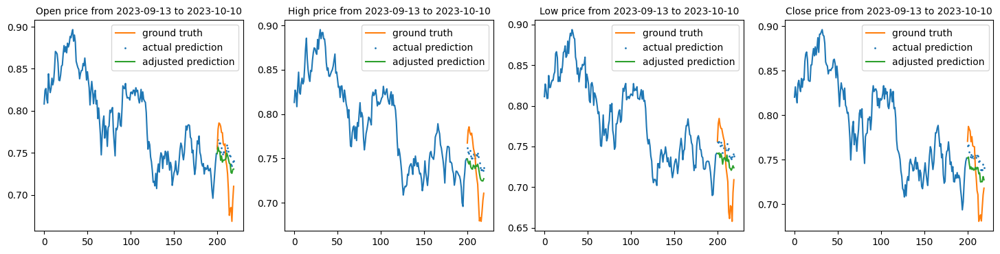

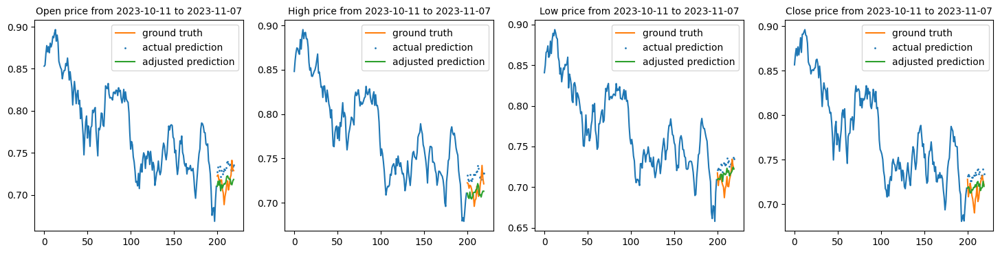

5722/5722 [==============================] - 118s 21ms/step - loss: 9.9826e-04 - val_loss: 0.0011
Epoch 10/15
1/1 [==============================] - 0s 31ms/step


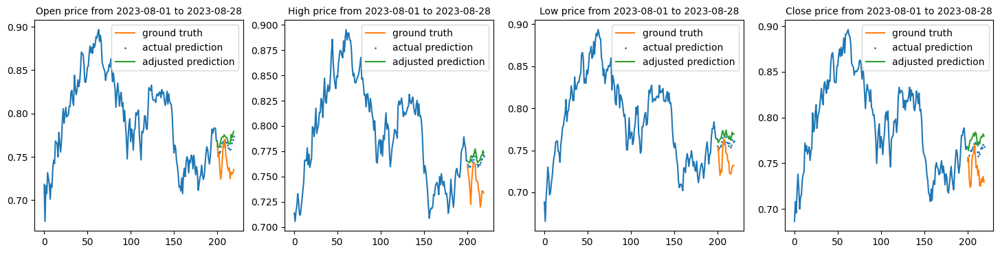

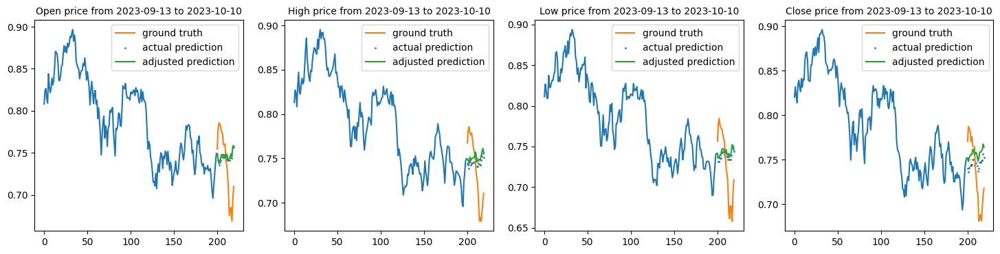

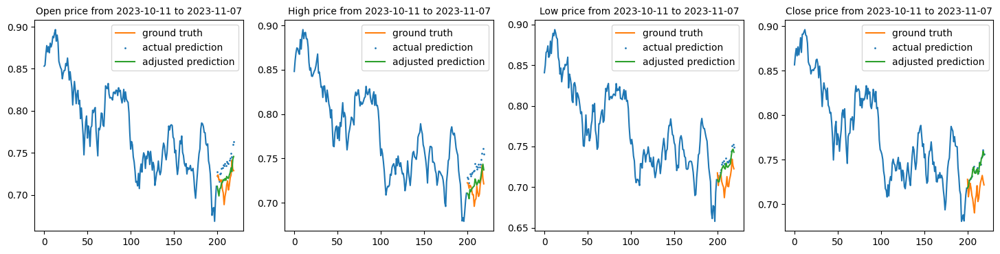

5722/5722 [==============================] - 121s 21ms/step - loss: 0.0010 - val_loss: 0.0010
Epoch 11/15
1/1 [==============================] - 0s 43ms/step


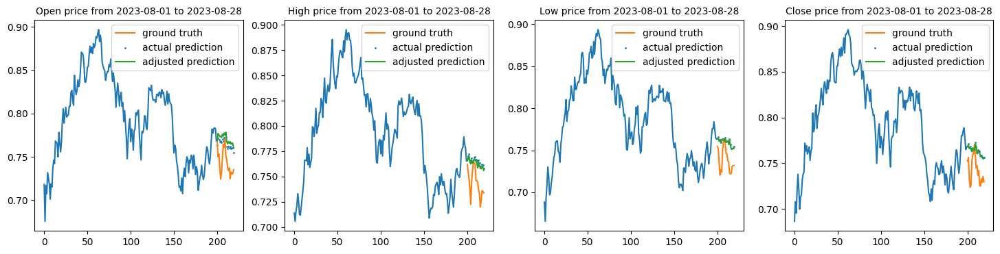

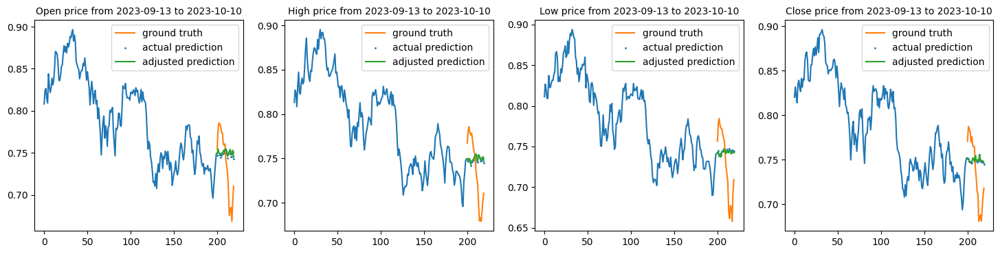

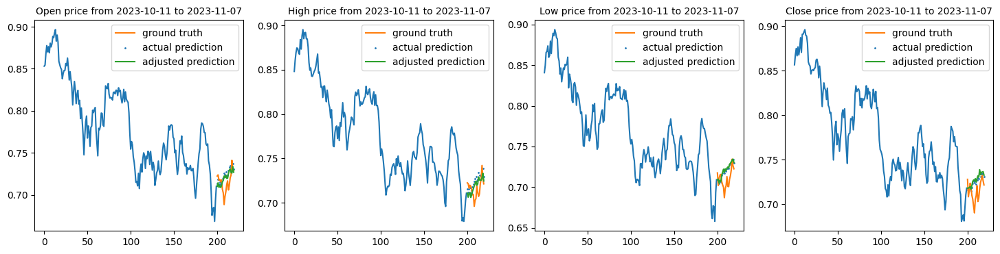

5722/5722 [==============================] - 117s 20ms/step - loss: 9.7621e-04 - val_loss: 8.7068e-04
Epoch 12/15
1/1 [==============================] - 0s 32ms/step


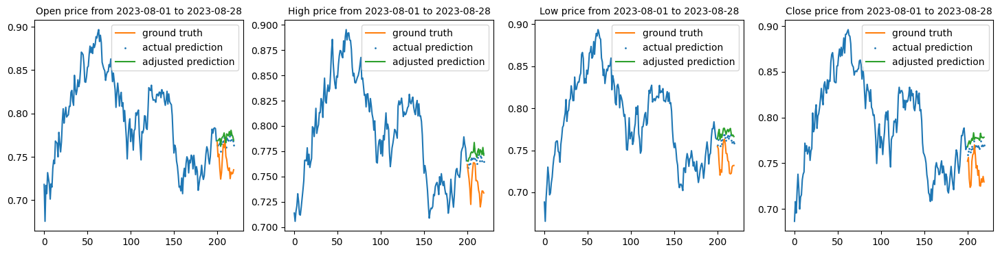

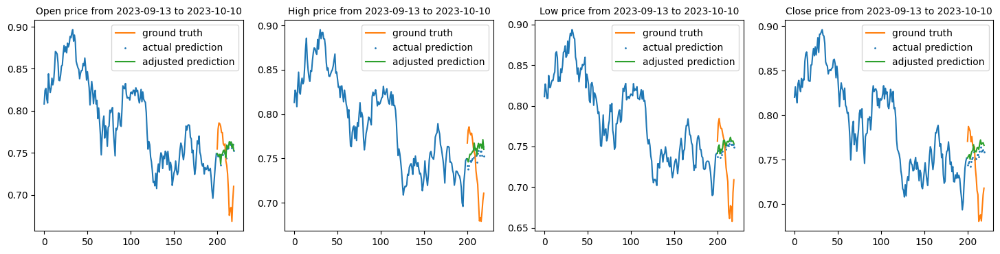

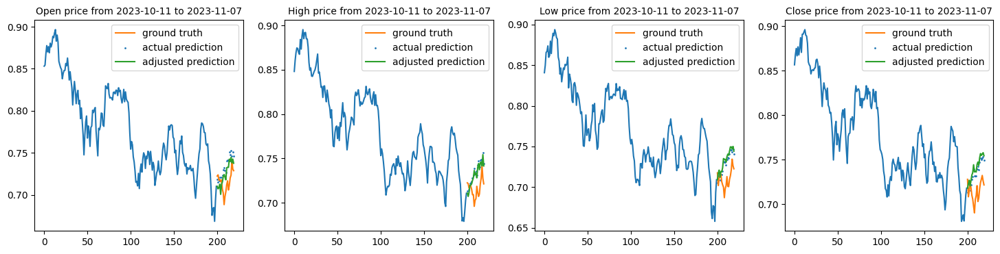

5722/5722 [==============================] - 119s 21ms/step - loss: 9.4871e-04 - val_loss: 0.0012
Epoch 13/15
1/1 [==============================] - 0s 44ms/step


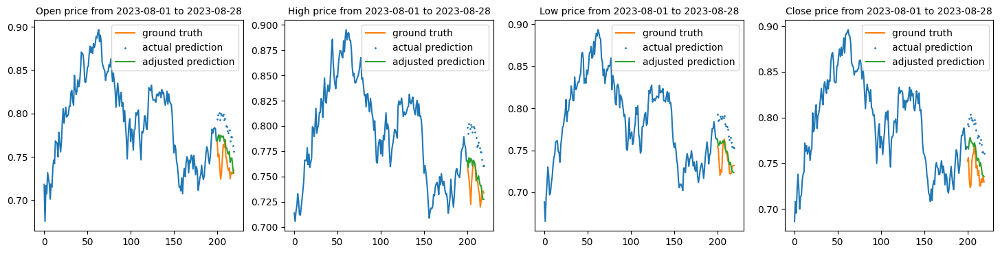

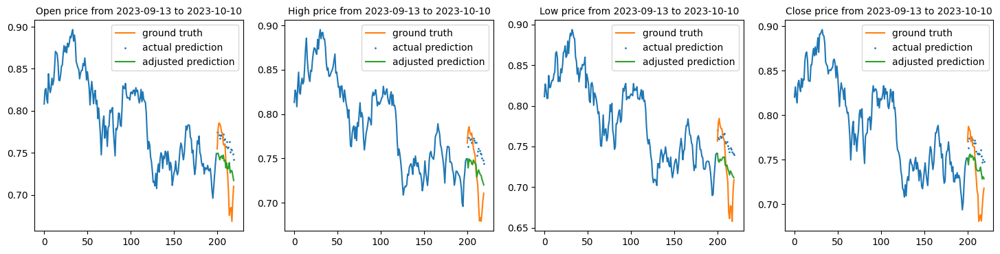

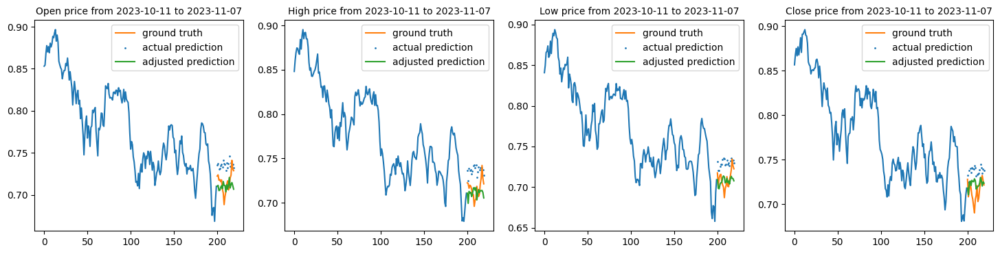

5722/5722 [==============================] - 117s 20ms/step - loss: 9.4285e-04 - val_loss: 0.0014
Epoch 14/15
1/1 [==============================] - 0s 50ms/step


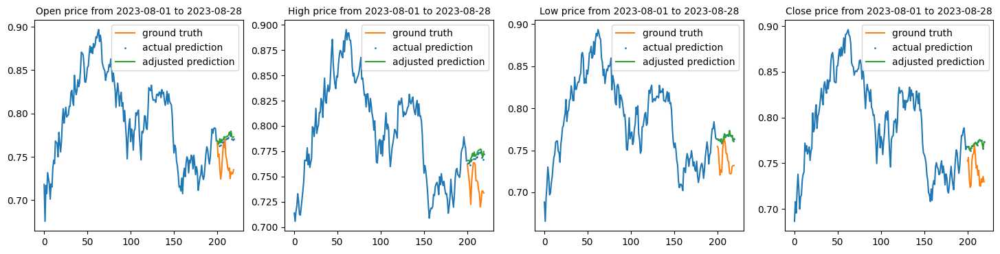

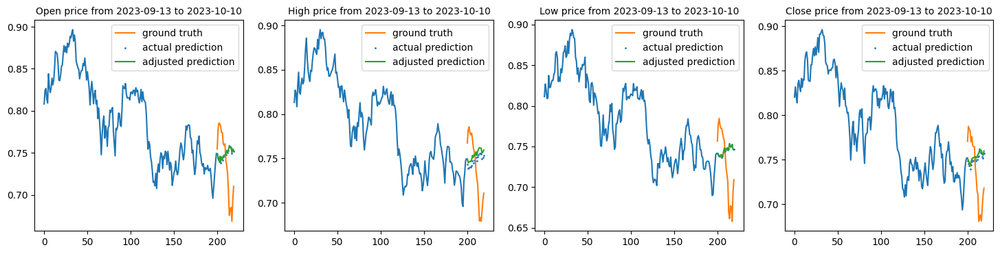

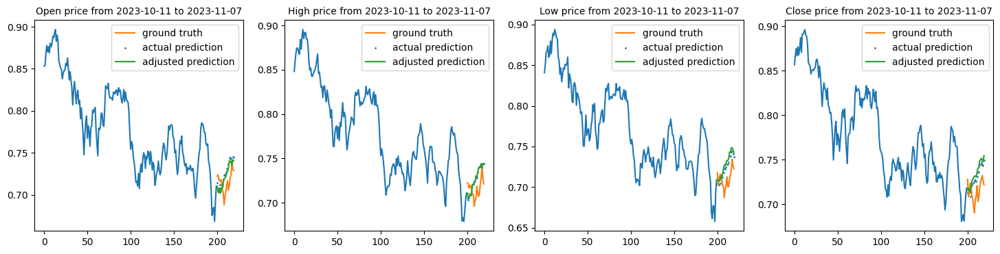

5722/5722 [==============================] - 120s 21ms/step - loss: 9.2627e-04 - val_loss: 0.0011
Epoch 15/15
1/1 [==============================] - 0s 33ms/step


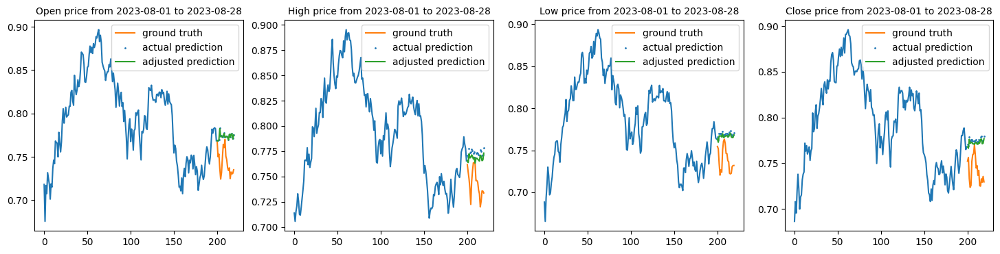

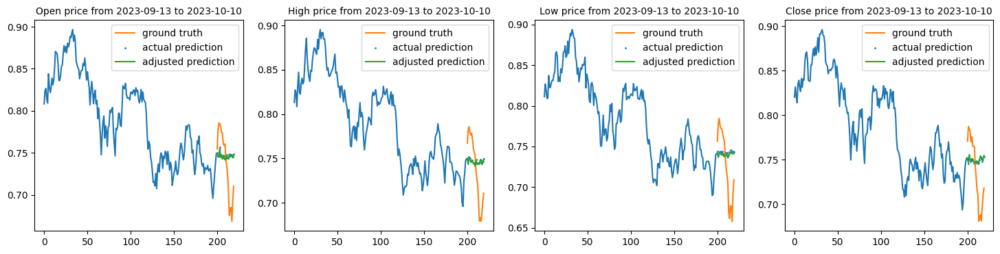

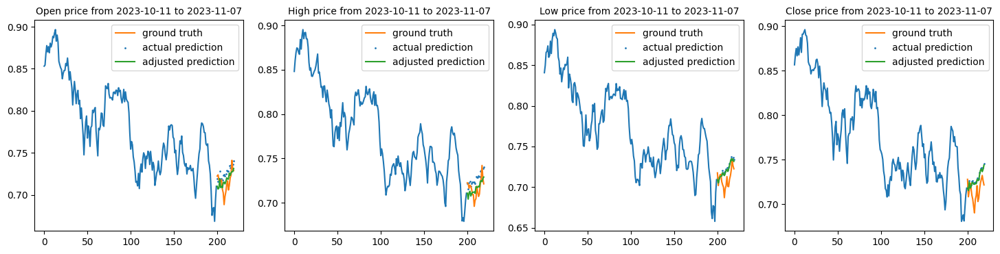

5722/5722 [==============================] - 116s 20ms/step - loss: 9.2138e-04 - val_loss: 0.0010
[0.0008203210891224444, 0.002831147750839591, 0.001374768209643662, 0.0007976025808602571, 0.0005316827446222305, 0.0007261089631356299, 0.001580186653882265, 0.0008013409096747637, 0.0010879967594519258, 0.0010262996656820178, 0.0008706830558367074, 0.001206879853270948, 0.001405616756528616, 0.0011453407350927591, 0.0010445696534588933]
[0.004283741116523743, 0.001450874493457377, 0.0012545202625915408, 0.001198803773149848, 0.0011440468952059746, 0.0011053194757550955, 0.0010667821625247598, 0.0010178574593737721, 0.0009982637129724026, 0.0010009752586483955, 0.0009762115660123527, 0.0009487071656621993, 0.0009428476332686841, 0.0009262681705877185, 0.0009213820449076593]


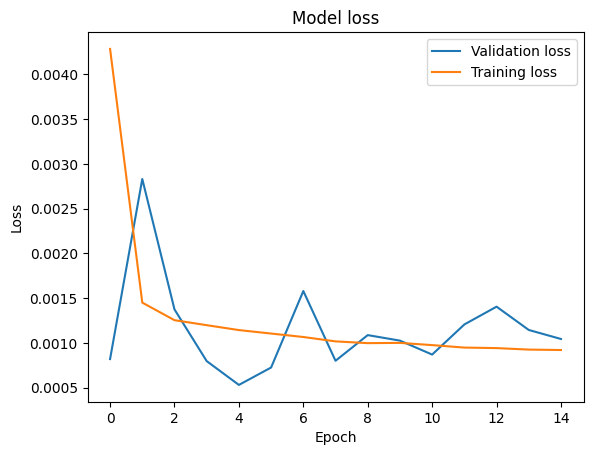

In [16]:
DUK_lstm_model_v_callback = CustomCallback(DUK_lstm_model_v, DUK_x_test[:,:,:], SPX_x_test[:,:,:], DUK_y_test[:,:,:5])
DUK_lstm_model_v_history = DUK_lstm_model_v.fit(DUK_x_train[:,:,1:].astype('float32'), DUK_y_train[:,:,1:5].astype('float32'), epochs=15, batch_size=1, callbacks=[DUK_lstm_model_v_callback], validation_data=(DUK_x_test[:,:,1:].astype('float32'), DUK_y_test[:,:,1:5].astype('float32')))
print(DUK_lstm_model_v_history.history['val_loss'])
print(DUK_lstm_model_v_history.history['loss'])

plt.plot(DUK_lstm_model_v_history.history['val_loss'])
plt.plot(DUK_lstm_model_v_history.history['loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Validation loss', 'Training loss'])
plt.show()

## Vanilla LSTM model- AAPL

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 200, 5)]          0         
                                                                 
 lstm_8 (LSTM)               (None, 200, 128)          68608     
                                                                 
 lstm_9 (LSTM)               (None, 128)               131584    
                                                                 
 dense_4 (Dense)             (None, 80)                10320     
                                                                 
 reshape_4 (Reshape)         (None, 20, 4)             0         
                                                                 
Total params: 210512 (822.31 KB)
Trainable params: 210512 (822.31 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


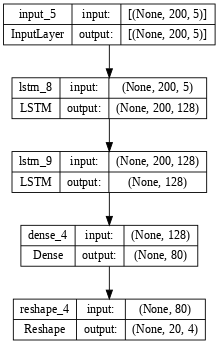

In [17]:
# Define input shape
input_shape = (200, 5)

# Input layer
inputs1 = Input(shape=input_shape)
lstm1 = LSTM(units=128, activation='tanh', return_sequences=True)(inputs1)
lstm1 = LSTM(units=128, activation='tanh')(lstm1)
output = Dense(80)(lstm1)
reshaped_output = Reshape((20, 4))(output)

AAPL_lstm_model_v = Model(inputs=inputs1, outputs=reshaped_output)
AAPL_lstm_model_v.compile(optimizer=Adam(learning_rate=0.0001), loss='mse')
AAPL_lstm_model_v.summary()

tf.keras.utils.plot_model(AAPL_lstm_model_v, show_shapes=True, dpi=64)

Epoch 1/15
1/1 [==============================] - 0s 36ms/step


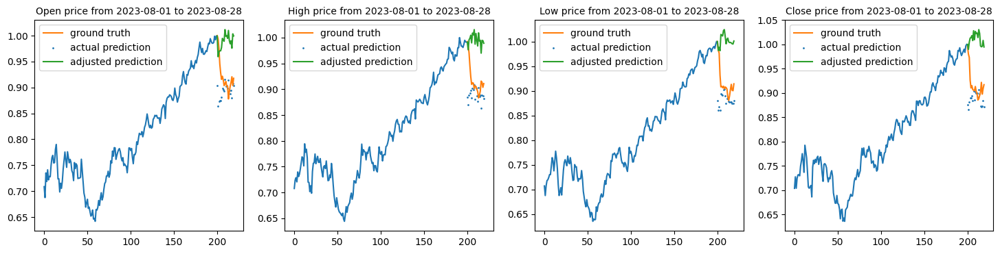

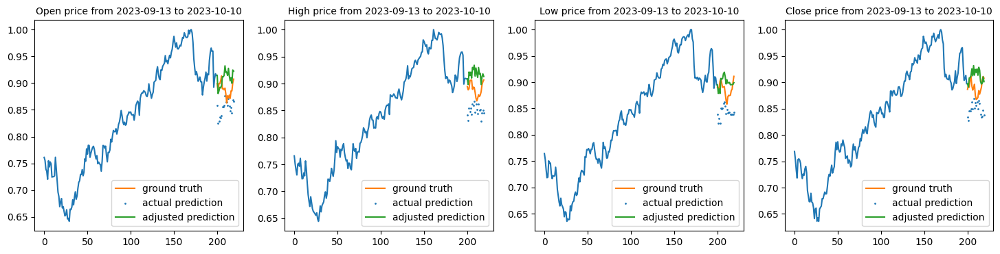

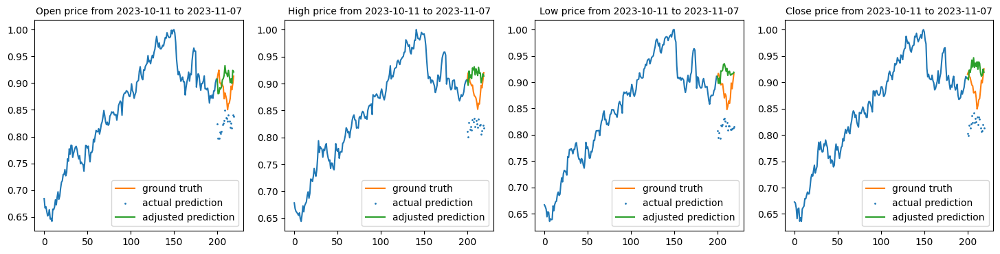

5722/5722 [==============================] - 125s 21ms/step - loss: 0.0024 - val_loss: 0.0033
Epoch 2/15
1/1 [==============================] - 0s 34ms/step


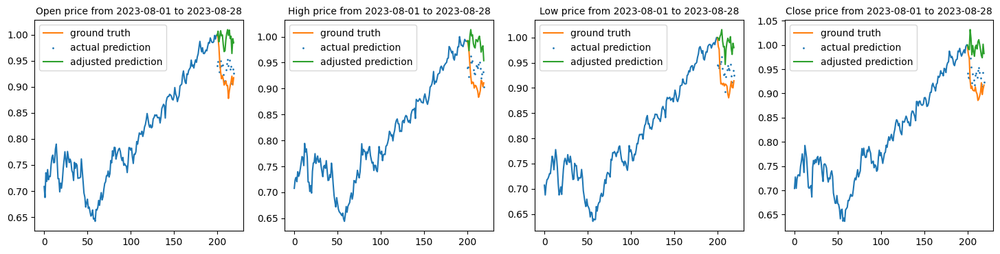

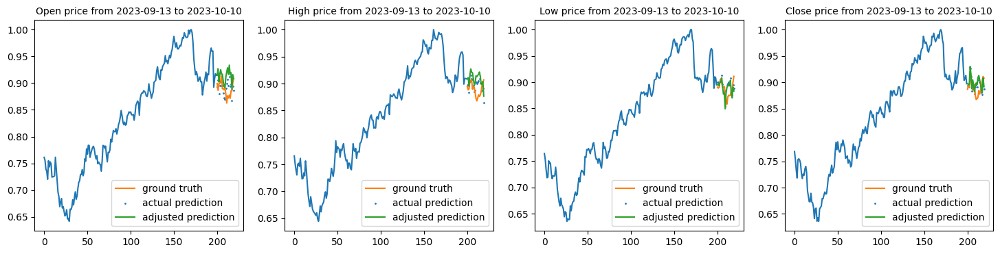

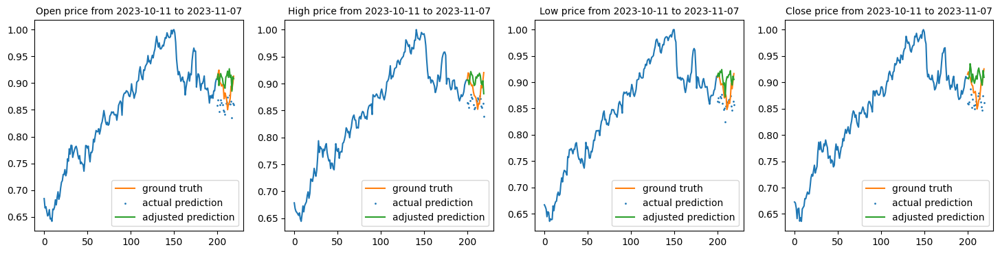

5722/5722 [==============================] - 118s 21ms/step - loss: 5.9218e-04 - val_loss: 0.0010
Epoch 3/15
1/1 [==============================] - 0s 35ms/step


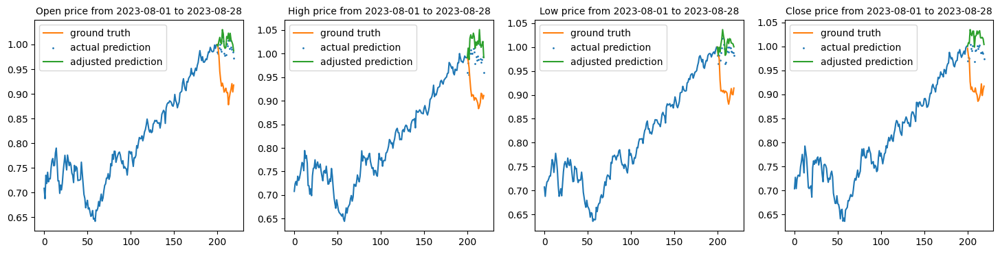

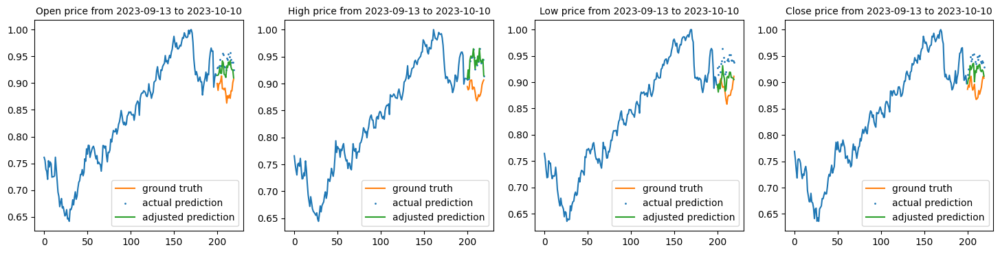

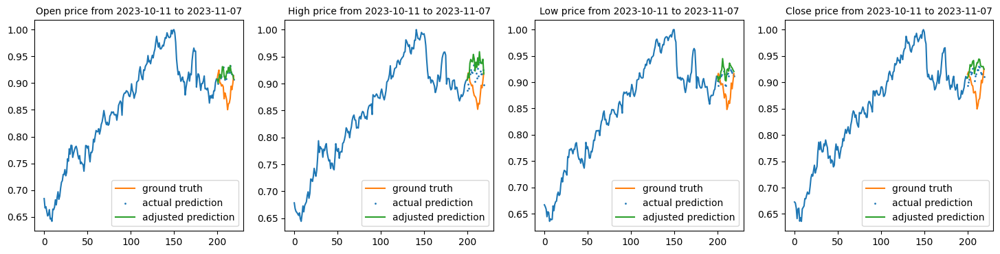

5722/5722 [==============================] - 116s 20ms/step - loss: 5.2436e-04 - val_loss: 0.0036
Epoch 4/15
1/1 [==============================] - 0s 51ms/step


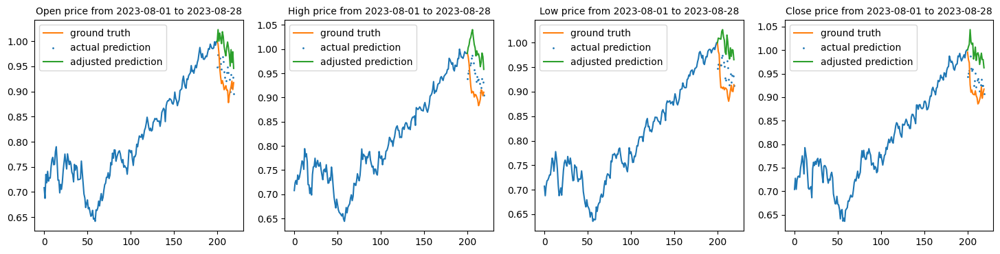

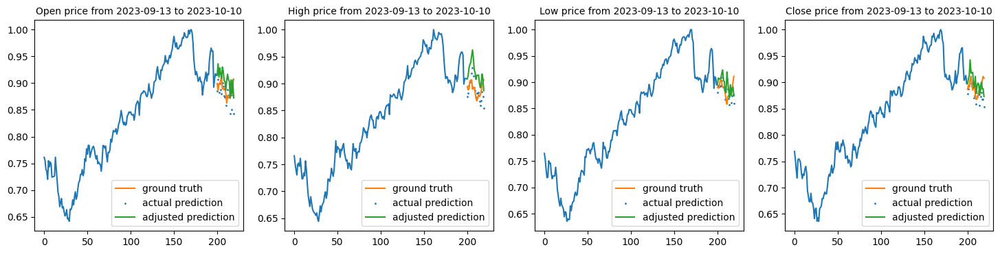

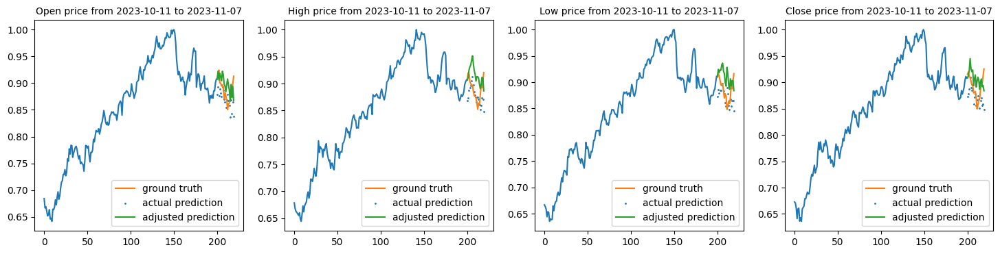

5722/5722 [==============================] - 113s 20ms/step - loss: 4.6202e-04 - val_loss: 9.0716e-04
Epoch 5/15
1/1 [==============================] - 0s 38ms/step


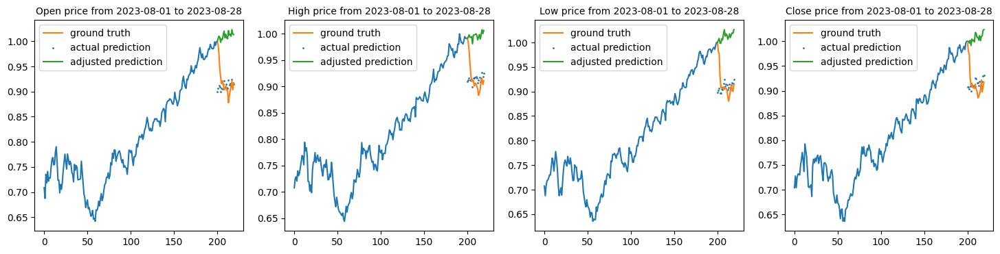

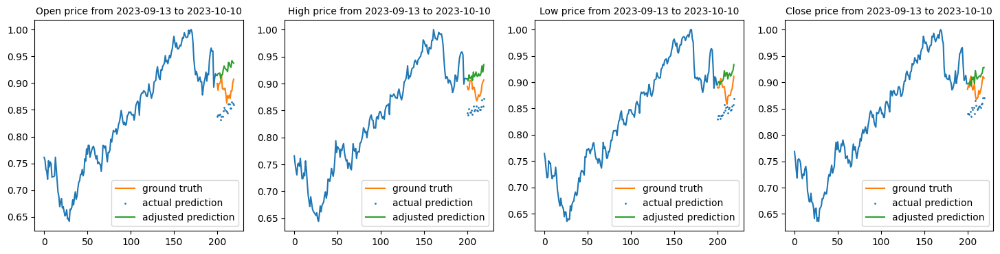

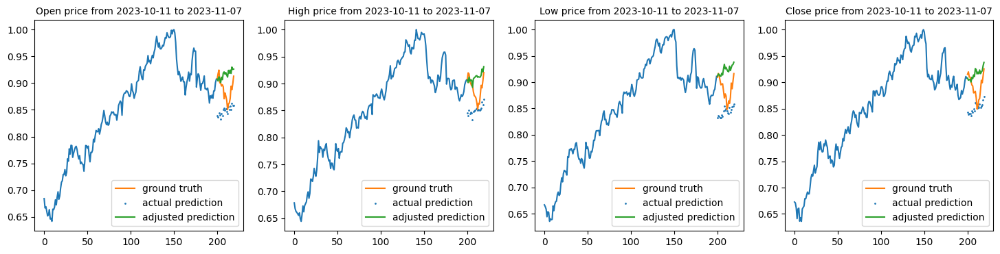

5722/5722 [==============================] - 104s 18ms/step - loss: 4.1749e-04 - val_loss: 0.0017
Epoch 6/15
1/1 [==============================] - 0s 23ms/step


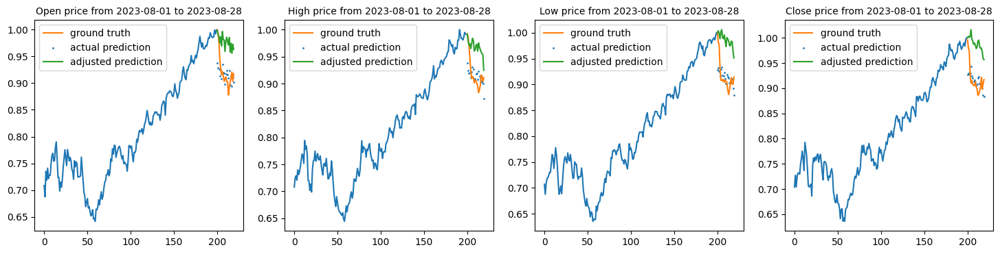

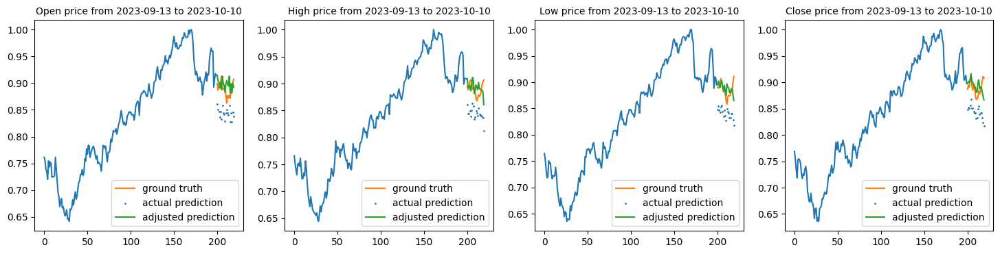

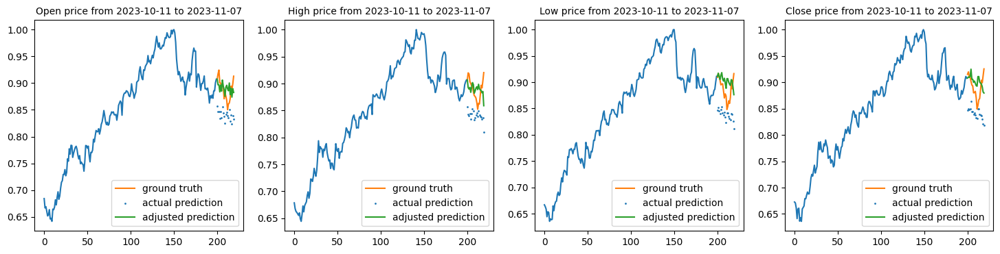

5722/5722 [==============================] - 104s 18ms/step - loss: 4.0953e-04 - val_loss: 0.0020
Epoch 7/15
1/1 [==============================] - 0s 22ms/step


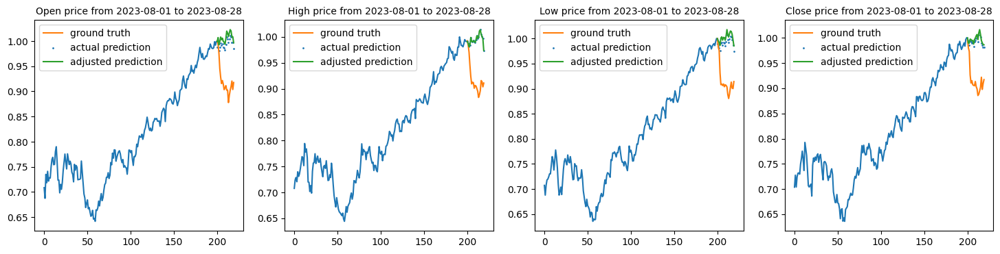

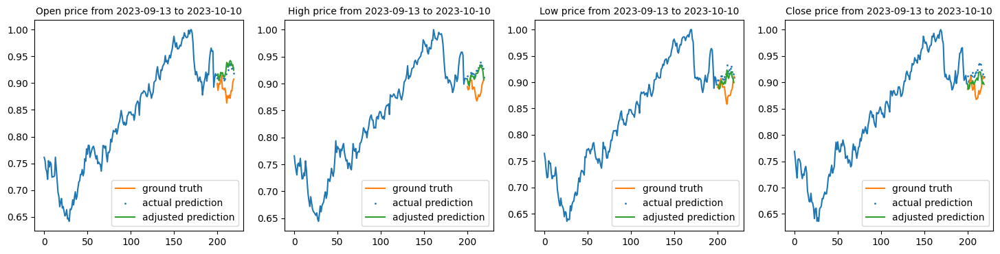

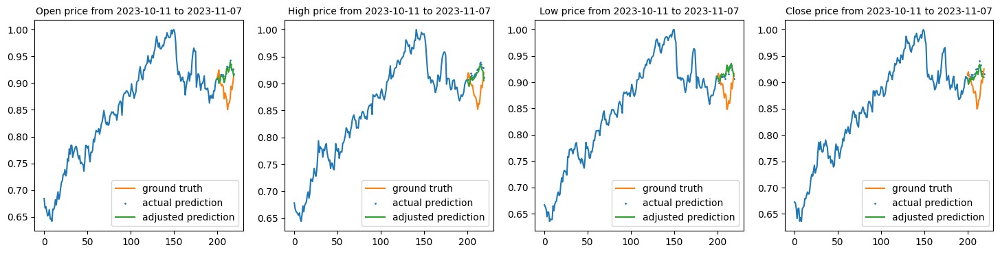

5722/5722 [==============================] - 113s 20ms/step - loss: 3.8430e-04 - val_loss: 0.0032
Epoch 8/15
1/1 [==============================] - 0s 23ms/step


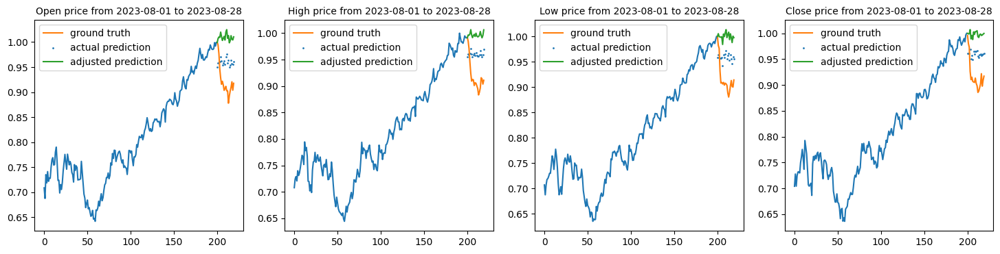

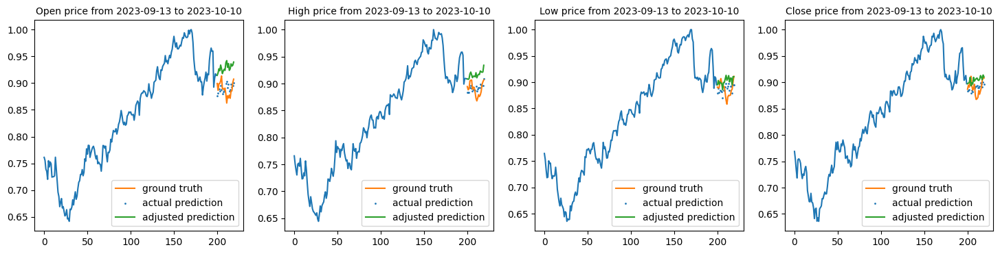

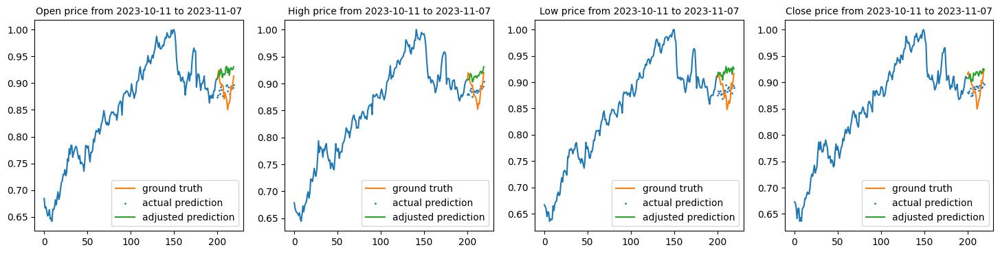

5722/5722 [==============================] - 114s 20ms/step - loss: 3.8333e-04 - val_loss: 0.0011
Epoch 9/15
1/1 [==============================] - 0s 47ms/step


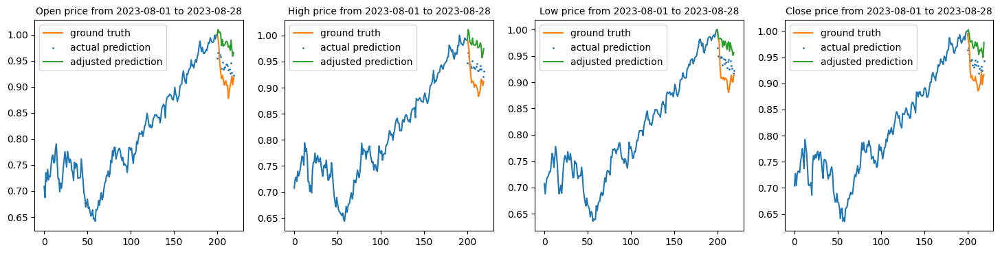

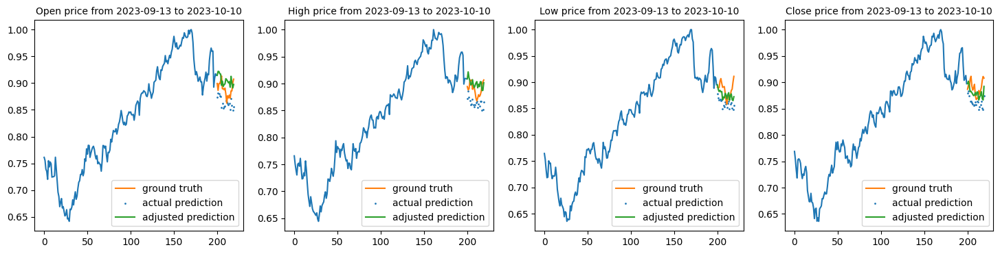

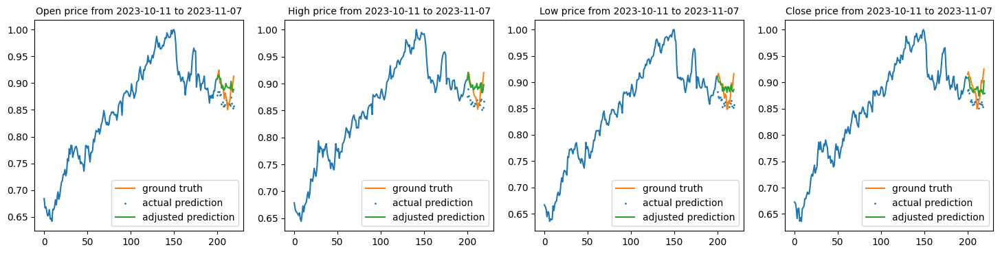

5722/5722 [==============================] - 118s 21ms/step - loss: 3.5043e-04 - val_loss: 9.3472e-04
Epoch 10/15
1/1 [==============================] - 0s 31ms/step


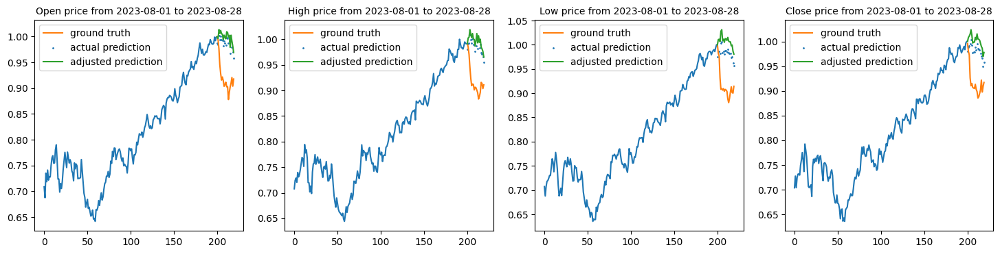

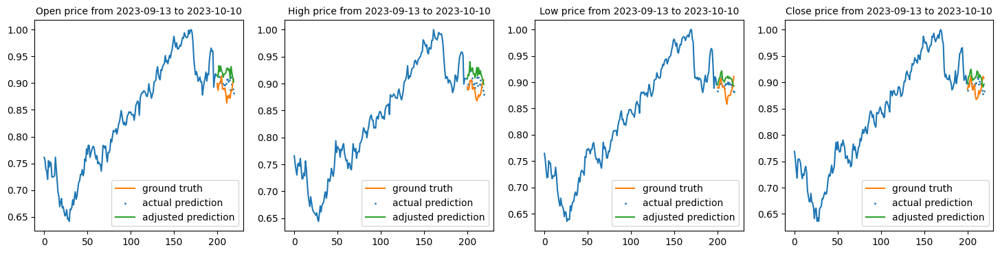

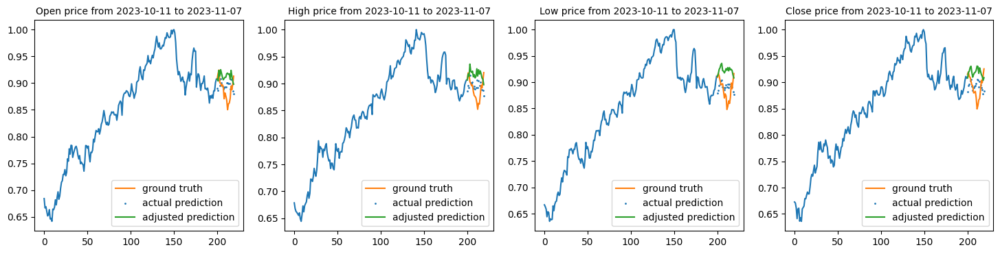

5722/5722 [==============================] - 114s 20ms/step - loss: 3.4709e-04 - val_loss: 0.0021
Epoch 11/15
1/1 [==============================] - 0s 32ms/step


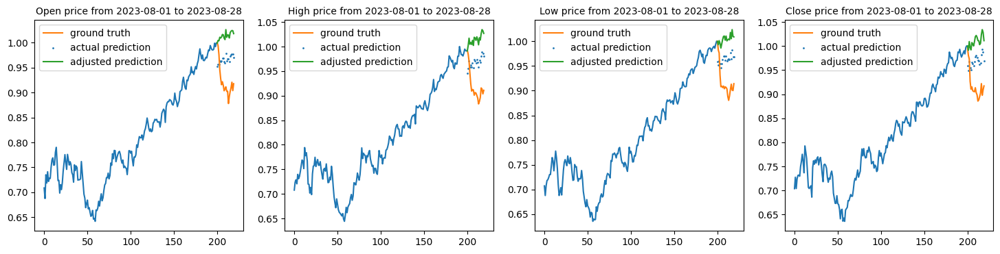

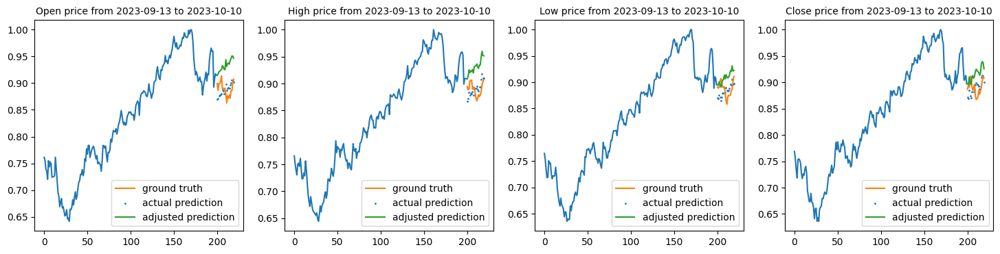

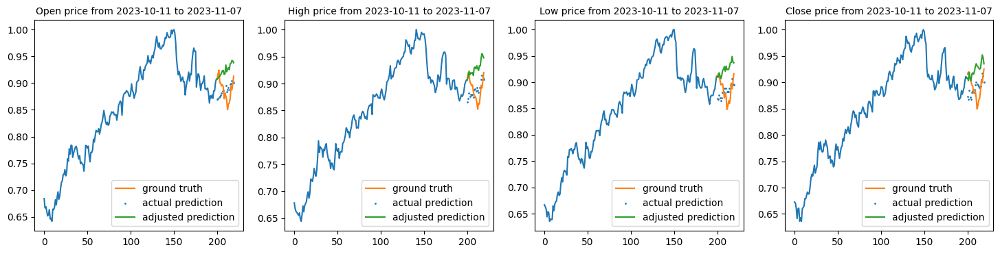

5722/5722 [==============================] - 118s 21ms/step - loss: 3.5357e-04 - val_loss: 0.0015
Epoch 12/15
1/1 [==============================] - 0s 69ms/step


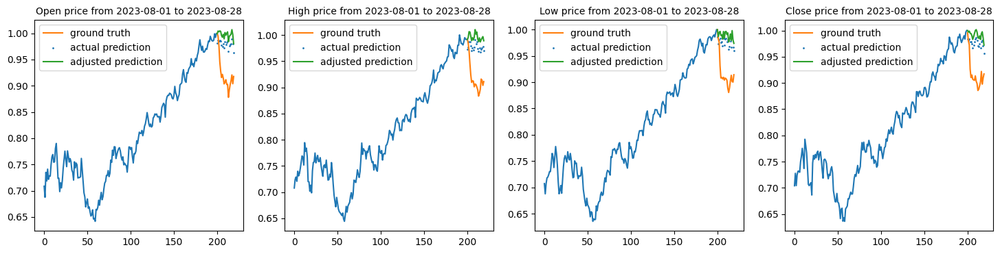

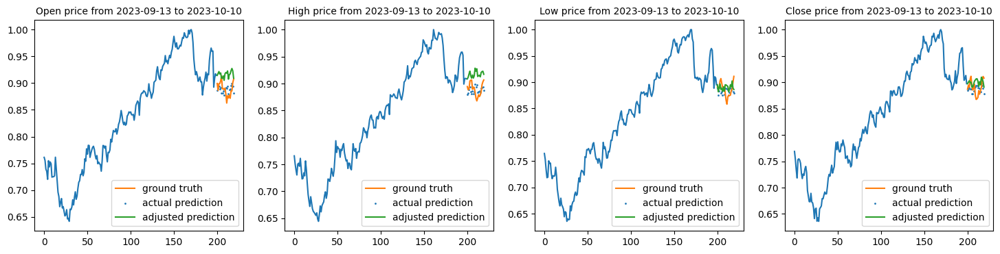

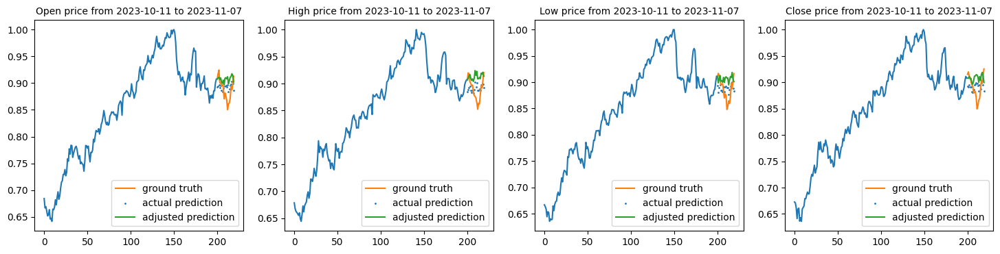

5722/5722 [==============================] - 118s 21ms/step - loss: 3.4776e-04 - val_loss: 0.0016
Epoch 13/15
1/1 [==============================] - 0s 46ms/step


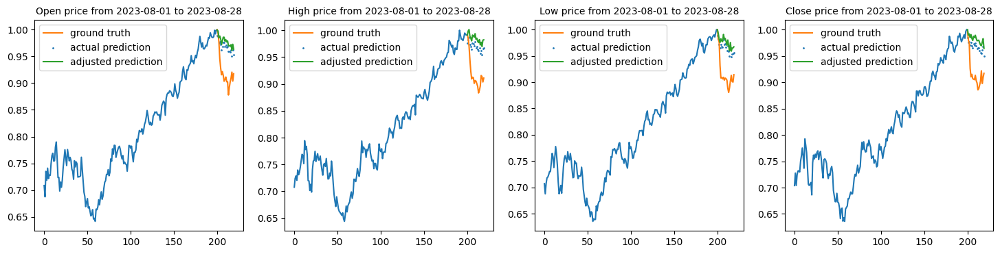

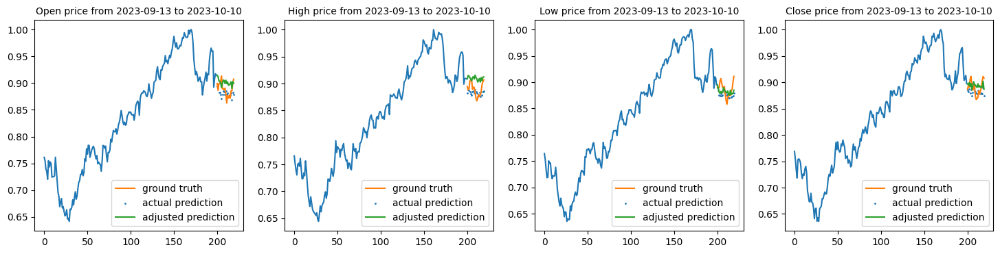

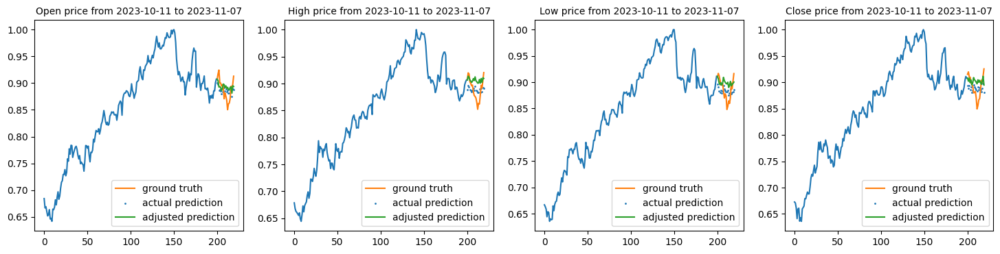

5722/5722 [==============================] - 120s 21ms/step - loss: 3.3010e-04 - val_loss: 0.0012
Epoch 14/15
1/1 [==============================] - 0s 39ms/step


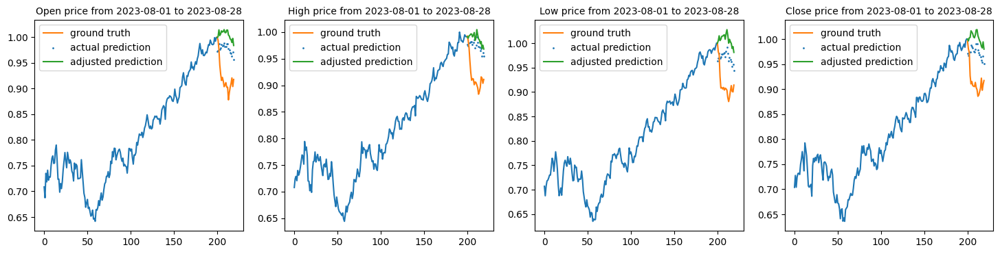

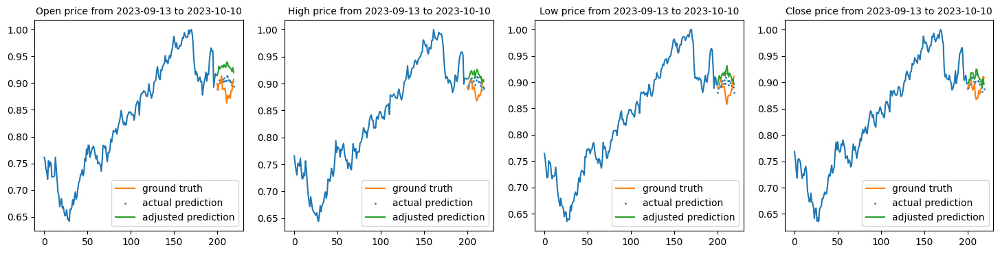

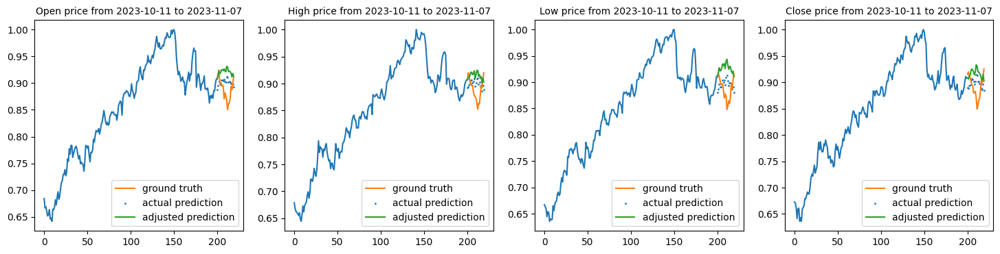

5722/5722 [==============================] - 118s 21ms/step - loss: 3.3732e-04 - val_loss: 0.0018
Epoch 15/15
1/1 [==============================] - 0s 32ms/step


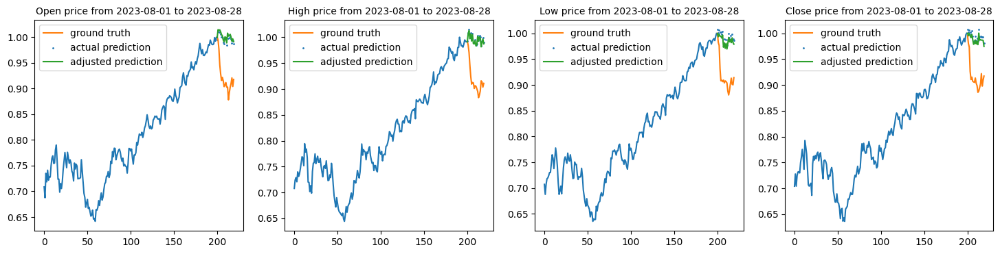

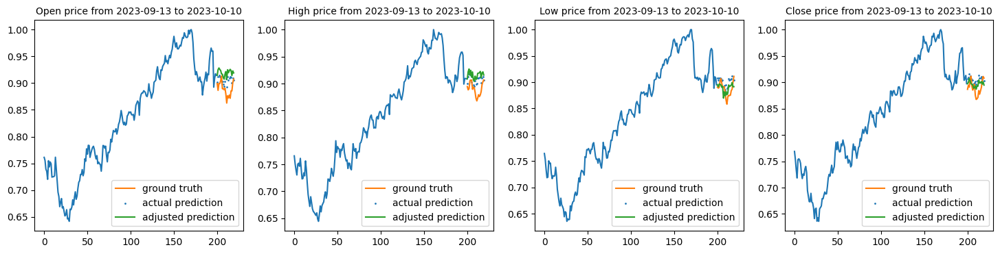

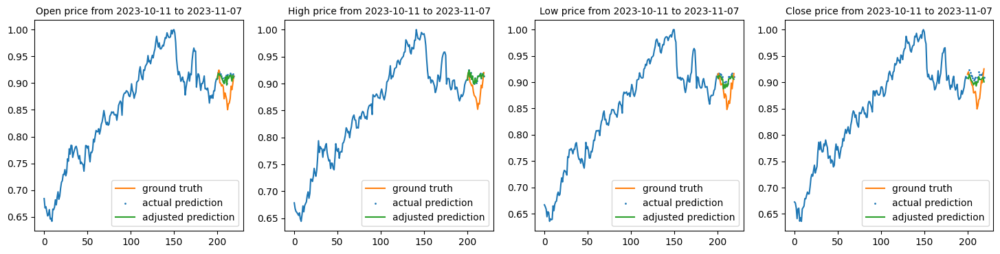

5722/5722 [==============================] - 117s 21ms/step - loss: 3.2868e-04 - val_loss: 0.0026
[0.003323313547298312, 0.0010110045550391078, 0.003616099478676915, 0.0009071589447557926, 0.0017227145144715905, 0.0020309165120124817, 0.0032097725197672844, 0.001130729098804295, 0.0009347156155854464, 0.0020868966821581125, 0.0015259148785844445, 0.0016344188479706645, 0.0012245215475559235, 0.0017634294927120209, 0.0026488937437534332]
[0.002380885649472475, 0.0005921752308495343, 0.000524361792486161, 0.00046202325029298663, 0.00041749002411961555, 0.0004095268377568573, 0.0003842975420411676, 0.00038332882104441524, 0.00035042682429775596, 0.0003470949304755777, 0.0003535663418006152, 0.0003477649297565222, 0.00033010327024385333, 0.0003373178478796035, 0.00032867875415831804]


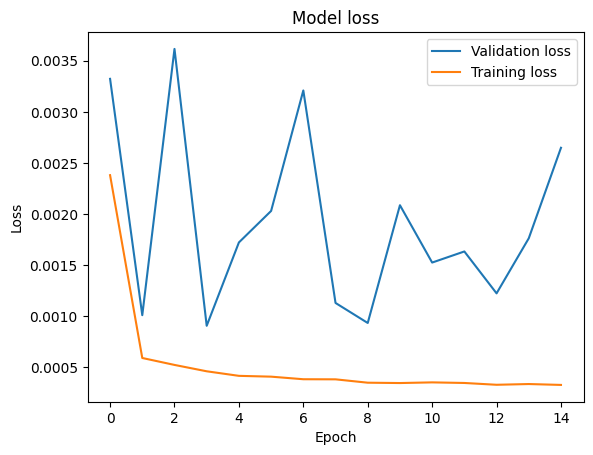

In [18]:
AAPL_lstm_model_v_callback = CustomCallback(AAPL_lstm_model_v, AAPL_x_test[:,:,:], SPX_x_test[:,:,:], AAPL_y_test[:,:,:5])
AAPL_lstm_model_v_history = AAPL_lstm_model_v.fit(AAPL_x_train[:,:,1:].astype('float32'), AAPL_y_train[:,:,1:5].astype('float32'), epochs=15, batch_size=1, callbacks=[AAPL_lstm_model_v_callback], validation_data=(AAPL_x_test[:,:,1:].astype('float32'), AAPL_y_test[:,:,1:5].astype('float32')))

print(AAPL_lstm_model_v_history.history['val_loss'])
print(AAPL_lstm_model_v_history.history['loss'])

plt.plot(AAPL_lstm_model_v_history.history['val_loss'])
plt.plot(AAPL_lstm_model_v_history.history['loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Validation loss', 'Training loss'])
plt.show()